In [1]:
from utils import dataloader
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from importlib import reload  

import matplotlib.pyplot as plt

import numpy as np

import torch as th
import torch.nn as nn
import os
from datetime import datetime
import matplotlib as mpl
import torch.optim as optim
import pytorch_ssim

import torch.nn.functional as F
import torchvision.models as models
from torch.autograd import Variable
import torchvision.transforms as transforms

In [2]:
dataloader = reload(dataloader)

plotsize = 15

partitions = dataloader.DataPartitions(
    past_frames=6,
    future_frames=1,
    root="../datasets/arda/04_21_full/",
    partial=0.6
)

dataset = dataloader.DataGenerator(
    root="../datasets/arda/04_21_full/",
    dataset_partitions=partitions.get_partitions(),
    past_frames=partitions.past_frames, 
    future_frames=partitions.future_frames,
    input_dim=(partitions.past_frames, 256, 256, 4),
    output_dim=(partitions.future_frames, 256, 256, 3),
    batch_size=4,
    buffer_size=1e3,
    buffer_memory=100,
    downsampling=False,
    dynamicity = 1e-2
)

In [3]:
X, Y, extra_batch = dataset.get_data()

X[X > 10e5] = 0 
Y[Y > 10e5] = 0


[x] 14 areas found
. . . . . . . . . . . . . . . . 
[7%] 16 valid sequences loaded
. . . . . . . . . . . . . . . . 
[14%] 16 valid sequences loaded
. . . . . . . . . . . . . . . . 
[21%] 16 valid sequences loaded
. . . . . . . . . . . . . . . . 
[29%] 16 valid sequences loaded
. . . . . . . . . . . . . . . . 
[36%] 16 valid sequences loaded
. . . . . . . . . . . . . . . . 
[43%] 16 valid sequences loaded
. . . . . . . . . . . . . . . . 
[50%] 16 valid sequences loaded
. . . . . . . . . . . . . . . . 
[57%] 16 valid sequences loaded
. . . . . . . . . . . . . . . . 
[64%] 16 valid sequences loaded
. . . . . . . . . . . . . . . . 
[71%] 16 valid sequences loaded
. . . . . . . . . . . . . . . . 
[79%] 16 valid sequences loaded
. . . . . . . . . . . . . . . . 
[86%] 16 valid sequences loaded
. . . . . . . . . . . . . . . . 
[93%] 16 valid sequences loaded
. . . . . . . . . . . . . . . . 
[100%] 16 valid sequences loaded


In [4]:
def unison_shuffled_copies(a, b):
    assert len(a) == len(b)
    p = np.random.permutation(len(a))
    return a[p], b[p]

X, Y = unison_shuffled_copies(X, Y)

In [5]:
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=42)

In [6]:
X_train.shape


(44, 4, 6, 256, 256, 4)

In [7]:
print("DEP min: {}\nVEL min: {}\nBTM min: {}".format(
    np.min(X_train[:, :, :, :, :, 0]),
    np.min(X_train[:, :, :, :, :, 1]),
    np.min(X_train[:, :, :, :, :, 2])
))

print("DEP max: {}\nVEL max: {}\nBTM max: {}".format(
    np.max(X_train[:, :, :, :, :, 0]),
    np.max(X_train[:, :, :, :, :, 1]),
    np.max(X_train[:, :, :, :, :, 2])
))

DEP min: 0.0
VEL min: -2.82978
BTM min: -0.593146
DEP max: 4.16357
VEL max: 5.48189
BTM max: 6.64461


### Model

In [8]:
import torch.nn.functional as F
from functools import partial

In [9]:
def xavier_weights(m):
    if isinstance(m, nn.Conv3d) or isinstance(m, nn.ConvTranspose3d):
        th.nn.init.xavier_uniform(m.weight.data)

def sqrt_weights(m):
    # https://stackoverflow.com/questions/49433936/how-to-initialize-weights-in-pytorch
    if isinstance(m, nn.Conv3d) or isinstance(m, nn.ConvTranspose3d):
        n = m.in_features
        y = 1.0/np.sqrt(n)
        m.weight.data.uniform_(-y, y)
        m.bias.data.fill_(0)

In [10]:
if th.cuda.is_available():
    dev = "cuda:0"
else:
    dev = "cpu"
device = th.device(dev)
print(device)

cuda:0


In [49]:
from models.ae import ConvLSTMCell
from models.ae import seq2seq_ConvLSTM
seq2seq_ConvLSTM = reload(seq2seq_ConvLSTM)

net = seq2seq_ConvLSTM.EncoderDecoderConvLSTM(nf=4, in_chan=4).to(device) # False: many to one

In [12]:
X_train = th.Tensor(X_train).to(device)
y_train = th.Tensor(y_train).to(device)

In [13]:
# b, s, t, h, w, c -> b, s, t, c, h, w
X_train = X_train.permute(0, 1, 2, 5, 3, 4)
y_train = y_train.permute(0, 1, 2, 5, 3, 4)

In [14]:
X_test = th.Tensor(X_test).to(device)
y_test = th.Tensor(y_test).to(device)

In [15]:
# b, s, t, h, w, c -> b, s, t, c, h, w
X_test = X_test.permute(0, 1, 2, 5, 3, 4)
y_test = y_test.permute(0, 1, 2, 5, 3, 4)

torch.Size([44, 4, 6, 4, 256, 256])


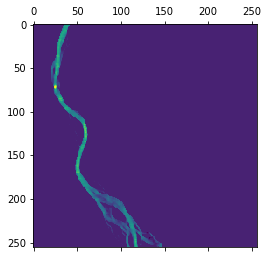

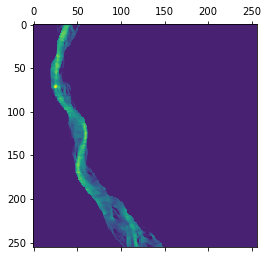

In [16]:
plt.matshow(X_train[5,2,0,2,:,:].cpu().numpy())
plt.matshow(y_train[5,2,0,2,:,:].cpu().numpy())
print(X_train.shape)

<ipython-input-17-37b3e947f1d3>:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(1, sequence.shape[0], figsize=(plotsize,plotsize))


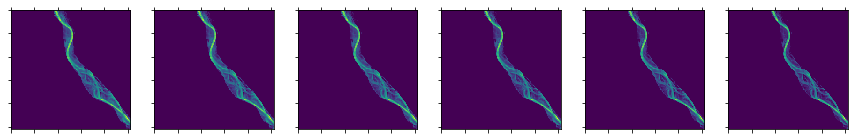

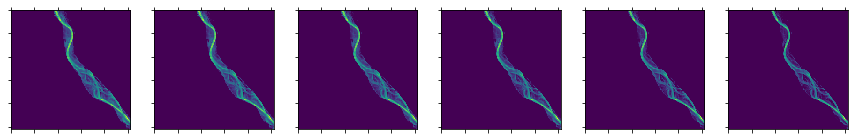

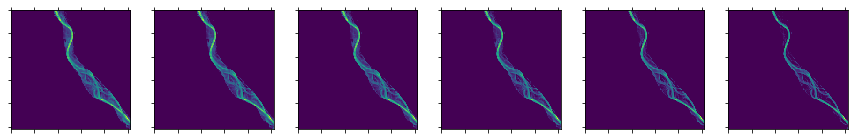

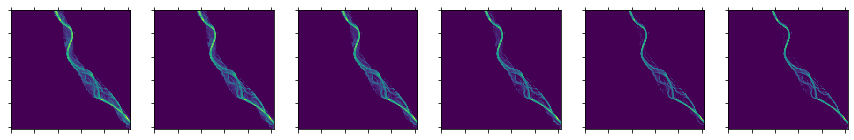

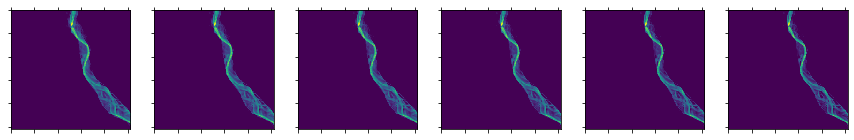

...

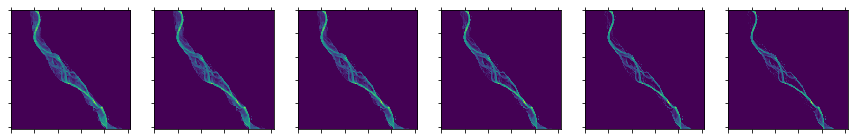

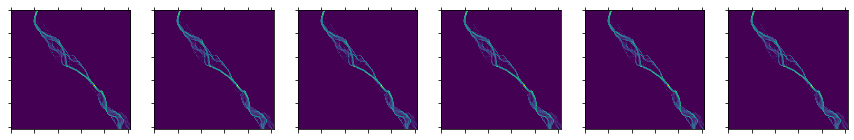

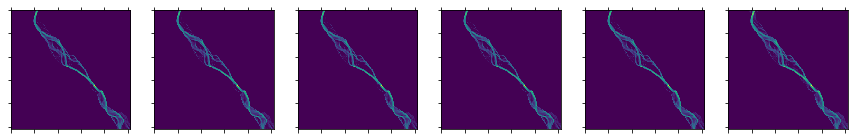

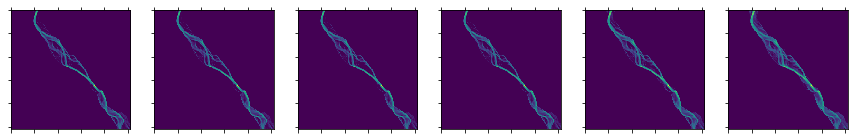

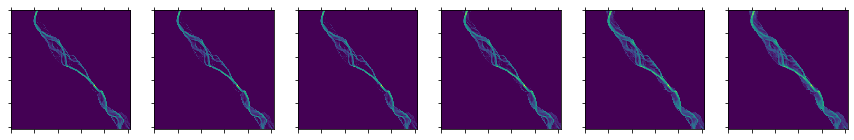

In [17]:
# Valid sequences
for i, batch in enumerate(X_train):

    if i == 10: break
    for j, sequence in enumerate(batch):

        # first three channels (dep, vvx, vvy): x/y aligned
        #sequence = np.concatenate((sequence[:,:3,:,:], y_train[i,j,:,0,:,:].unsqueeze(0)), axis=0)

        fig, axs = plt.subplots(1, sequence.shape[0], figsize=(plotsize,plotsize))

        for ax in axs:
            ax.set_yticklabels([])
            ax.set_xticklabels([])

        for k,frame in enumerate(sequence):   # x frames
            axs[k].matshow(frame[0].cpu().numpy())

In [50]:
ssim = pytorch_ssim.SSIM()
criterion = nn.MSELoss(reduction='sum')
optimizer = optim.Adam(net.parameters(), lr=1e-4)

In [51]:
losses = []
errors = []
test_errors = []

def mass_conservation_loss(output, target):

    # output: b, h, w
    diff = 0
    for i,datapoint in enumerate(output):
        target_sum = th.sum(
                th.abs(target[i])
            )
        pred_sum = th.sum(
                th.abs(output[i])
            )

        diff += th.abs(target_sum - pred_sum)/target_sum

    return diff

/home/diego/anaconda3/lib/python3.8/site-packages/torch/nn/modules/loss.py:445: UserWarning: Using a target size (torch.Size([4, 256, 256])) that is different to the input size (torch.Size([4, 1, 256, 256])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


epoch 0 -- avg loss: 79433.55708451704
[!] Comparison matrices printed


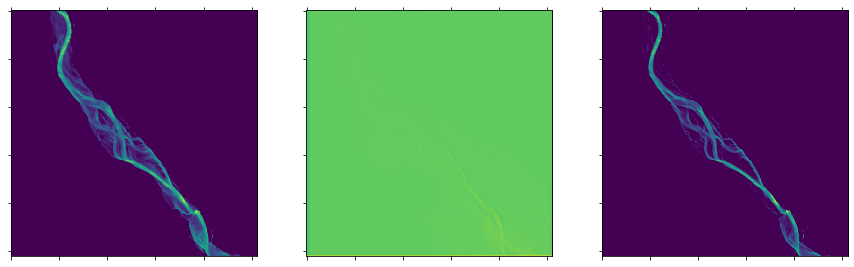

epoch 1 -- avg loss: 79261.20516690341
[!] Comparison matrices printed


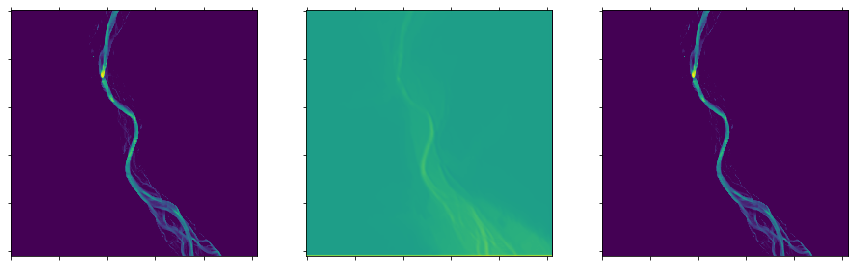

epoch 2 -- avg loss: 79053.39559659091
[!] Comparison matrices printed


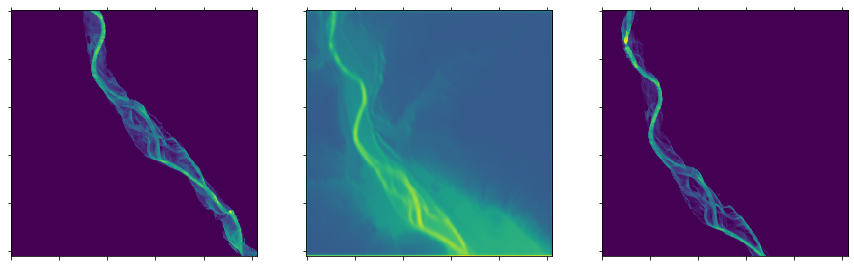

epoch 3 -- avg loss: 78566.67760120738
[!] Comparison matrices printed


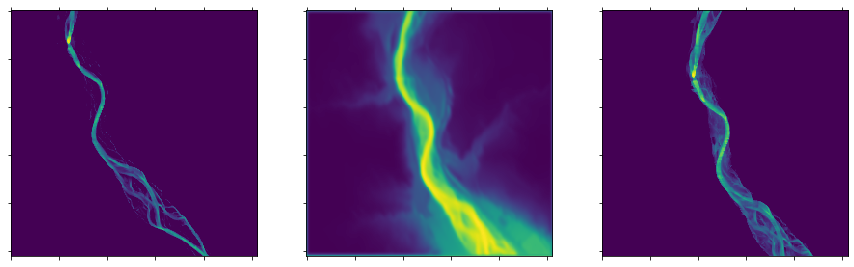

epoch 4 -- avg loss: 77313.0463778409
[!] Comparison matrices printed


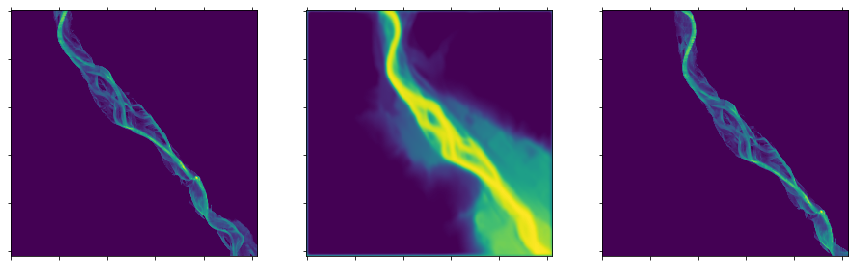

epoch 5 -- avg loss: 75517.64092832623
[!] Comparison matrices printed


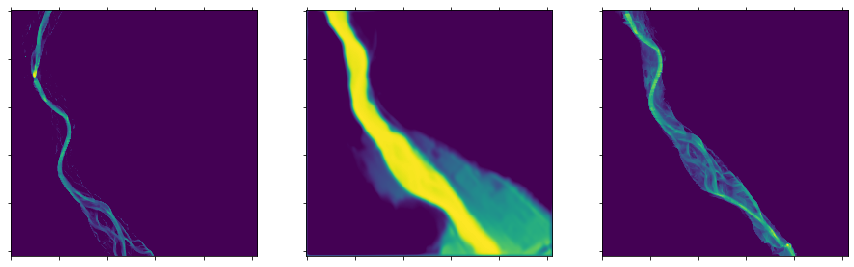

epoch 6 -- avg loss: 73141.53027977882
[!] Comparison matrices printed


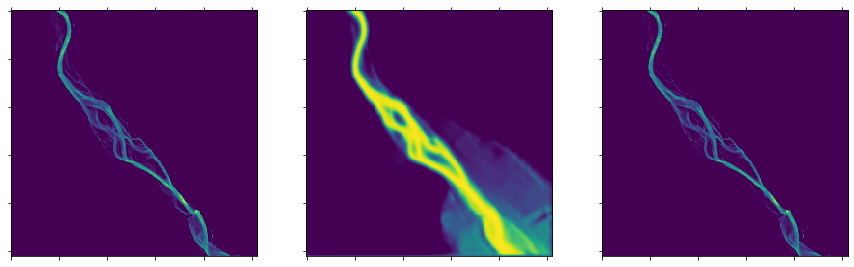

epoch 7 -- avg loss: 70219.95534446022
[!] Comparison matrices printed


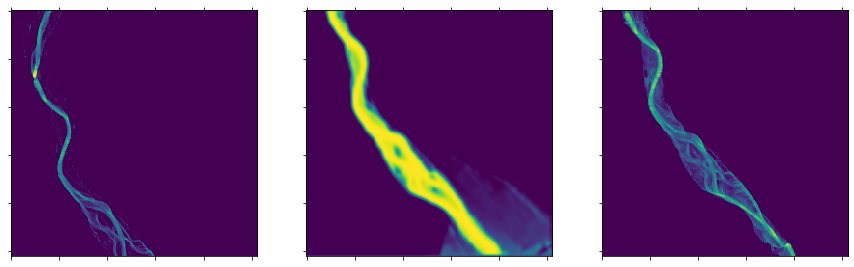

epoch 8 -- avg loss: 67179.90615875552
[!] Comparison matrices printed


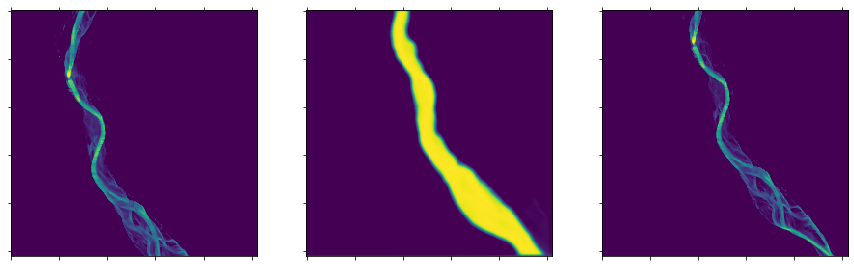

epoch 9 -- avg loss: 64325.47501553622
[!] Comparison matrices printed


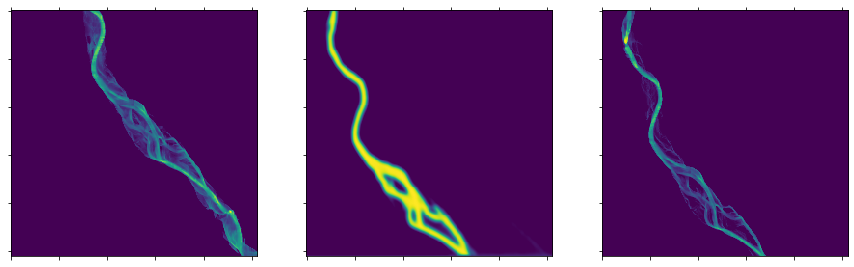

epoch 10 -- avg loss: 61723.600216700026
[!] Comparison matrices printed


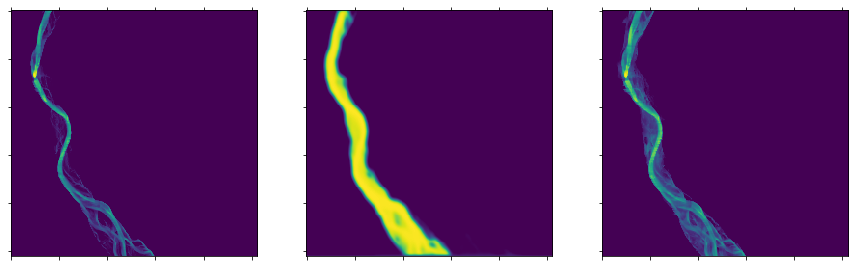

epoch 11 -- avg loss: 59353.04014448686
[!] Comparison matrices printed


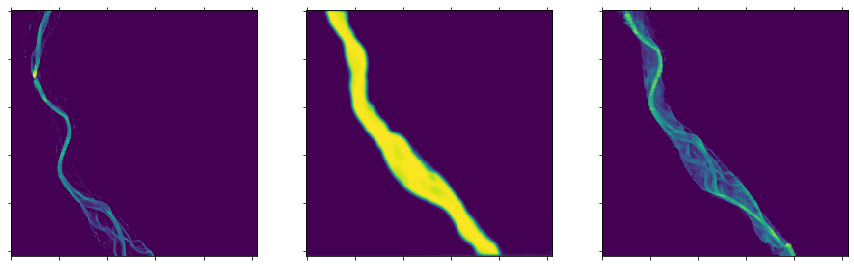

epoch 12 -- avg loss: 57174.816997821516
[!] Comparison matrices printed


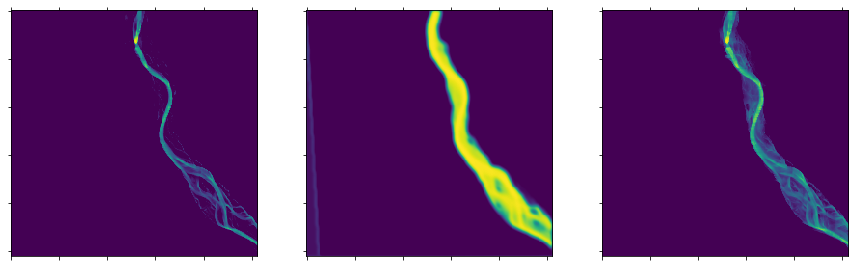

epoch 13 -- avg loss: 55162.550603693184
[!] Comparison matrices printed


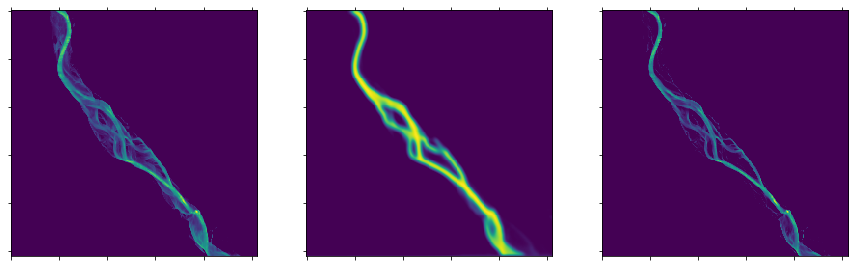

epoch 14 -- avg loss: 53295.97109670928
[!] Comparison matrices printed


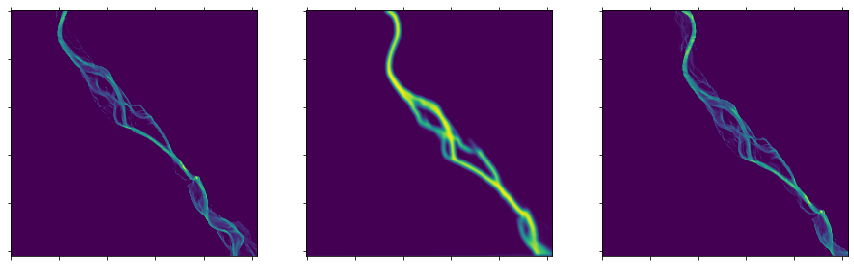

epoch 15 -- avg loss: 51558.30977214466
[!] Comparison matrices printed


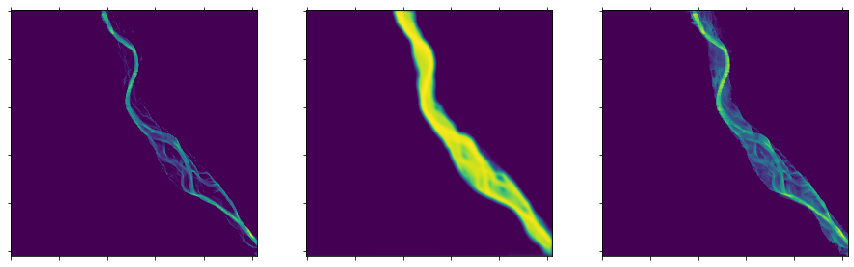

epoch 16 -- avg loss: 49934.74069523939
[!] Comparison matrices printed


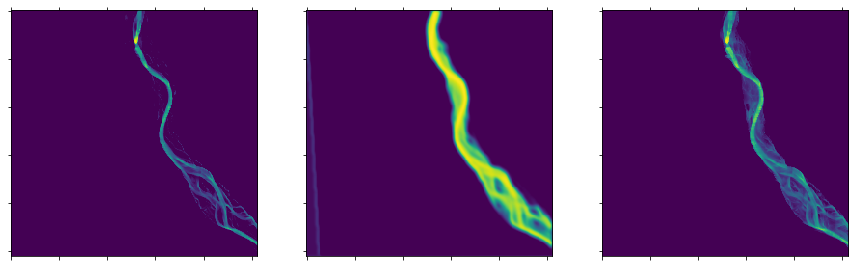

epoch 17 -- avg loss: 48412.61568689828
[!] Comparison matrices printed


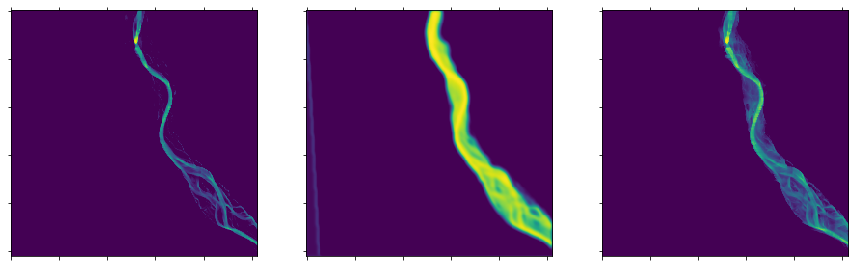

epoch 18 -- avg loss: 46981.92747388046
[!] Comparison matrices printed


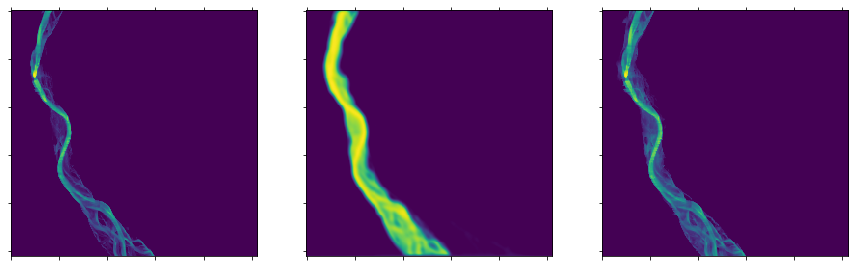

epoch 19 -- avg loss: 45635.34730502042
[!] Comparison matrices printed


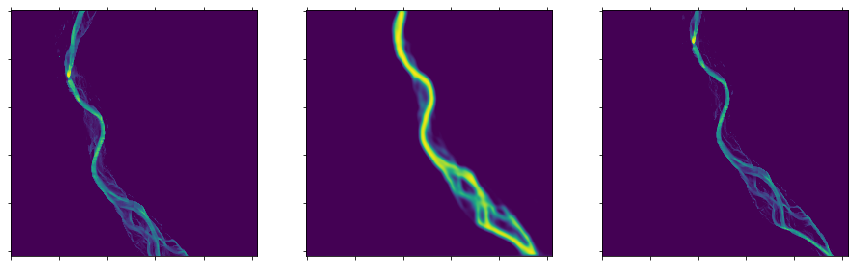

epoch 20 -- avg loss: 44367.60817966214
[!] Comparison matrices printed


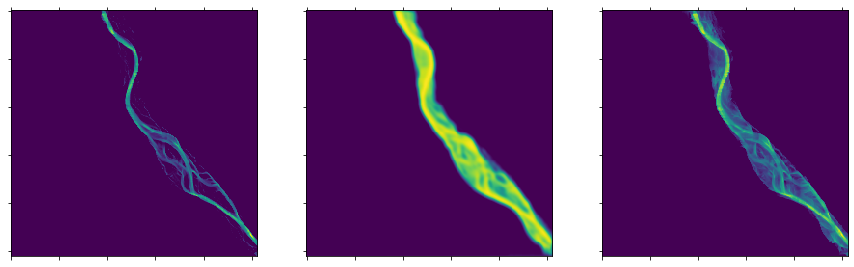

epoch 21 -- avg loss: 43174.497861247415
[!] Comparison matrices printed


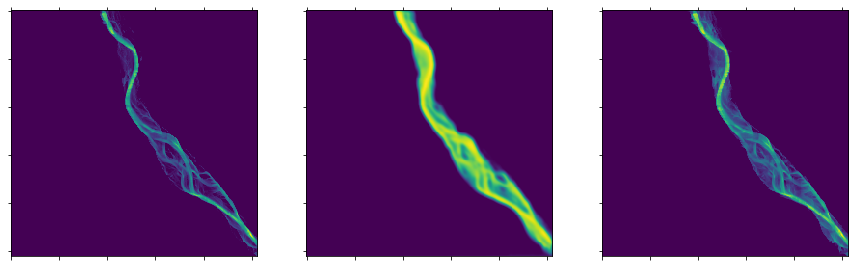

epoch 22 -- avg loss: 42051.85453223428
[!] Comparison matrices printed


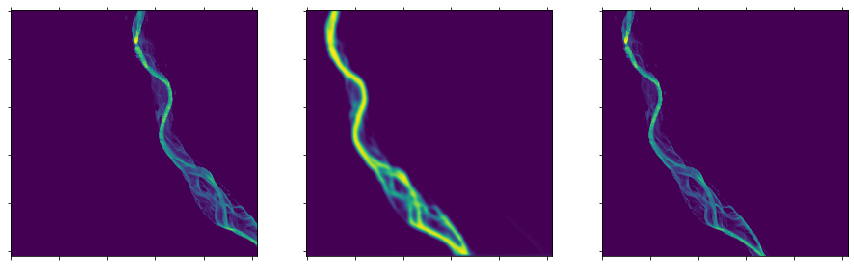

epoch 23 -- avg loss: 40995.09166486336
[!] Comparison matrices printed


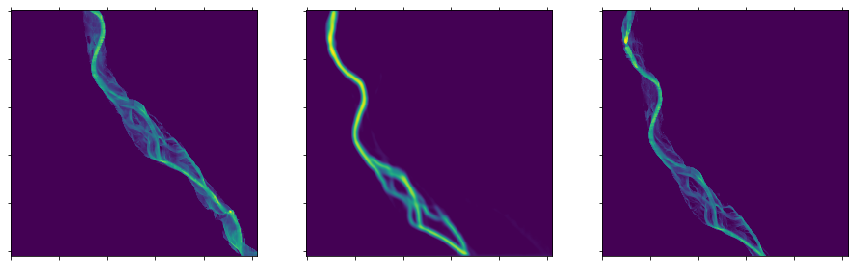

epoch 24 -- avg loss: 39999.33481378729
[!] Comparison matrices printed


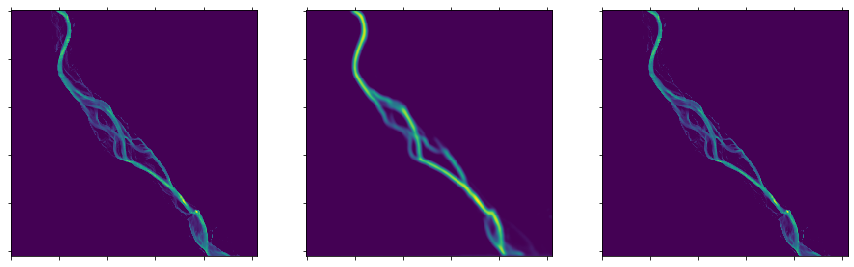

epoch 25 -- avg loss: 39059.78462806115
[!] Comparison matrices printed


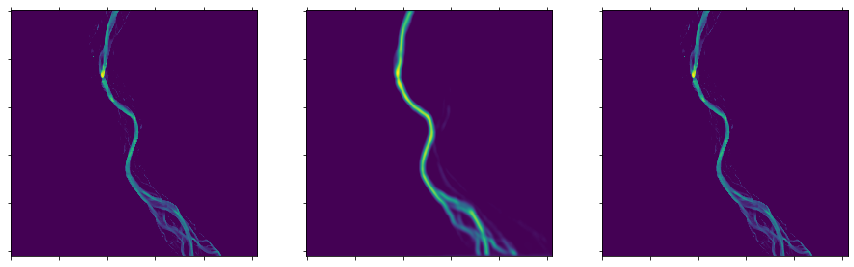

epoch 26 -- avg loss: 38171.94589901291
[!] Comparison matrices printed


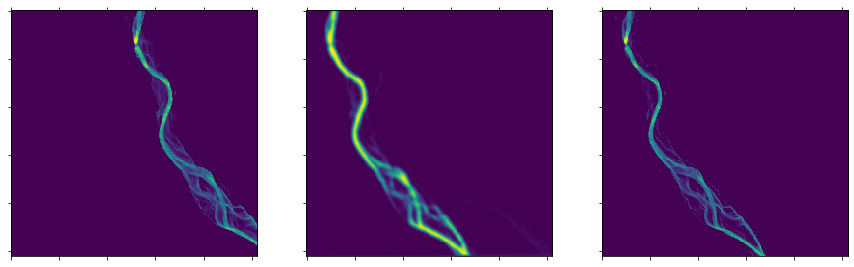

epoch 27 -- avg loss: 37331.69592780572
[!] Comparison matrices printed


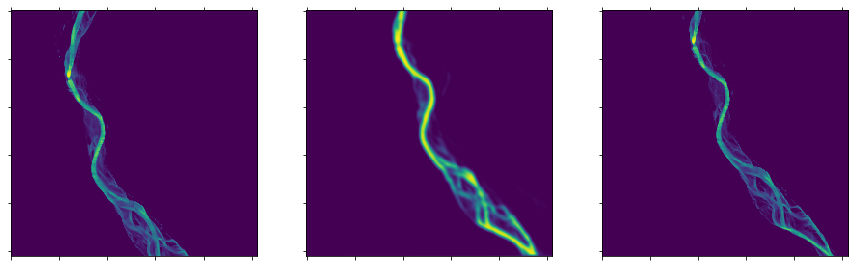

epoch 28 -- avg loss: 36535.28059851189
[!] Comparison matrices printed


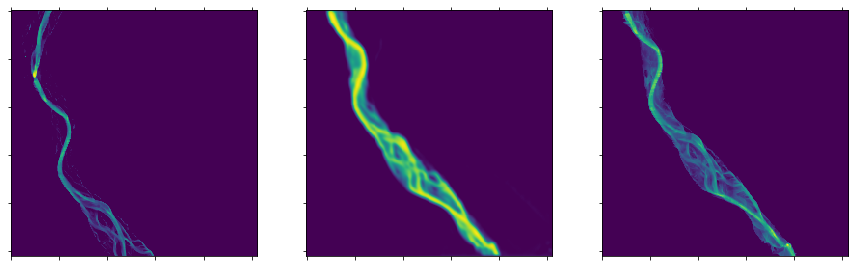

epoch 29 -- avg loss: 35779.262355920044
[!] Comparison matrices printed


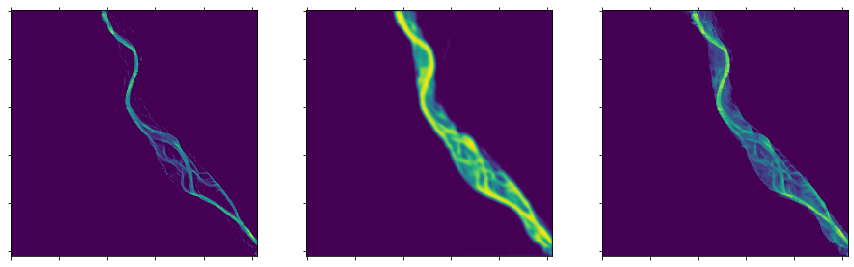

epoch 30 -- avg loss: 35060.47952189963
[!] Comparison matrices printed


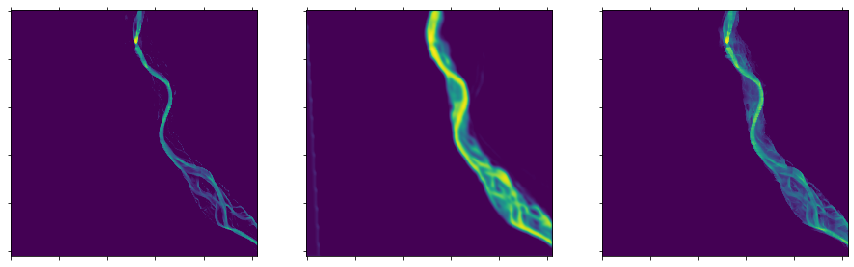

epoch 31 -- avg loss: 34376.01021003723
[!] Comparison matrices printed


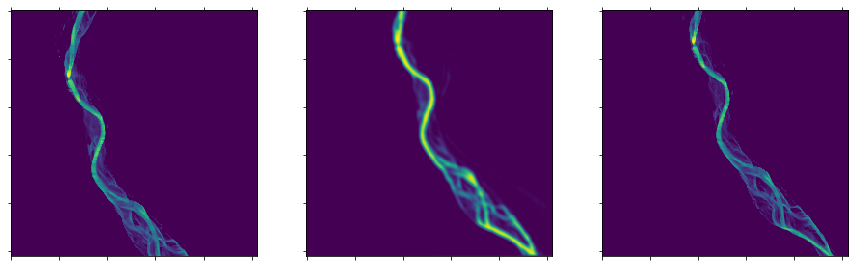

epoch 32 -- avg loss: 33723.18003571986
[!] Comparison matrices printed


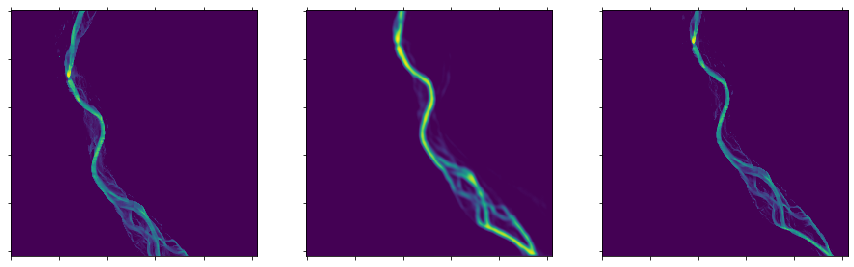

epoch 33 -- avg loss: 33099.63009741472
[!] Comparison matrices printed


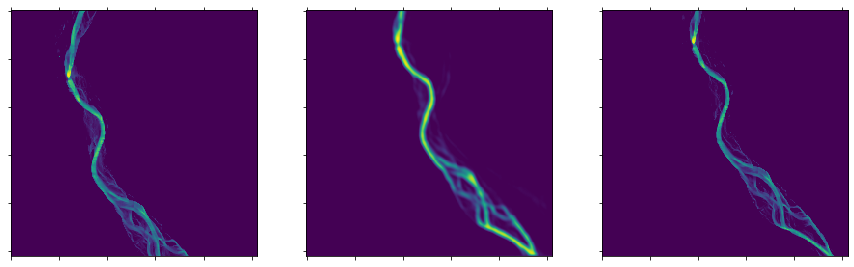

epoch 34 -- avg loss: 32503.39372558594
[!] Comparison matrices printed


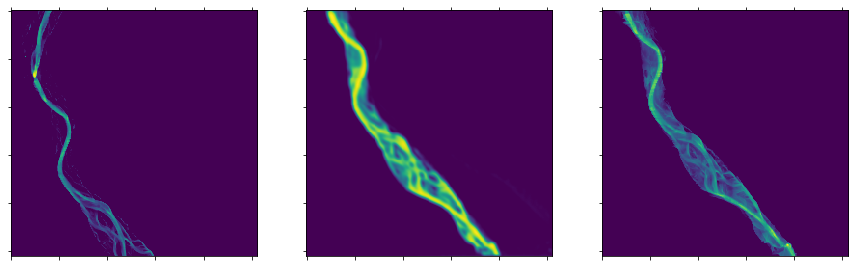

epoch 35 -- avg loss: 31932.841118552467
[!] Comparison matrices printed


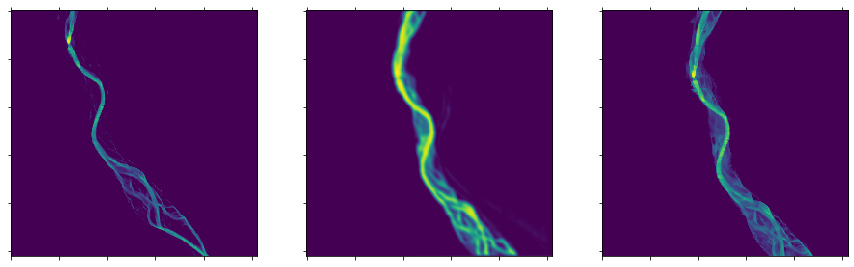

epoch 36 -- avg loss: 31386.55097260346
[!] Comparison matrices printed


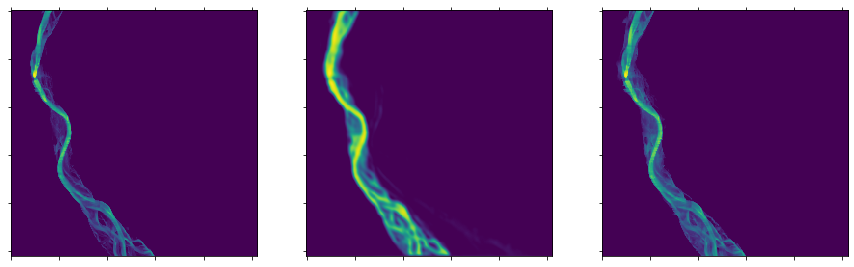

epoch 37 -- avg loss: 30863.2307152269
[!] Comparison matrices printed


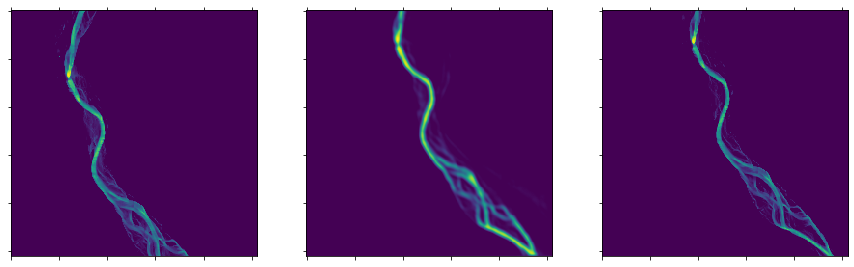

epoch 38 -- avg loss: 30361.67048100825
[!] Comparison matrices printed


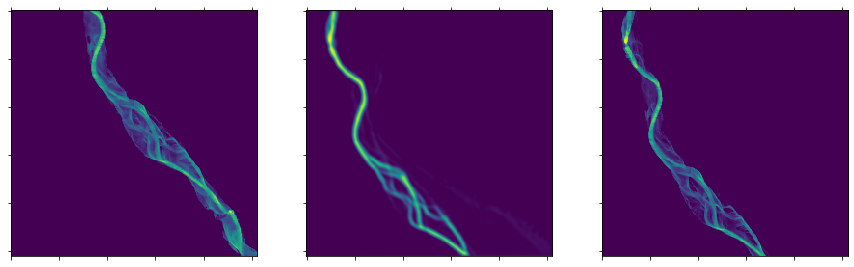

epoch 39 -- avg loss: 29880.71870436235
[!] Comparison matrices printed


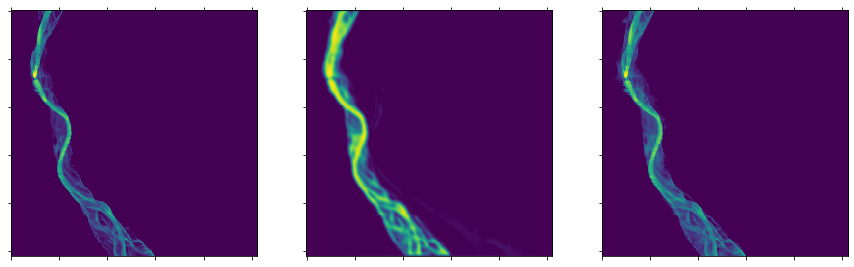

epoch 40 -- avg loss: 29419.270840325535
[!] Comparison matrices printed


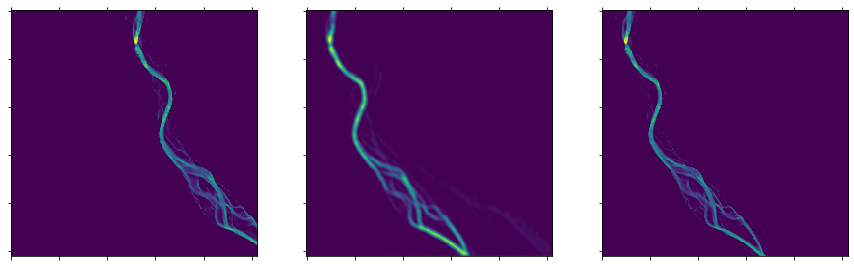

epoch 41 -- avg loss: 28976.268517564386
[!] Comparison matrices printed


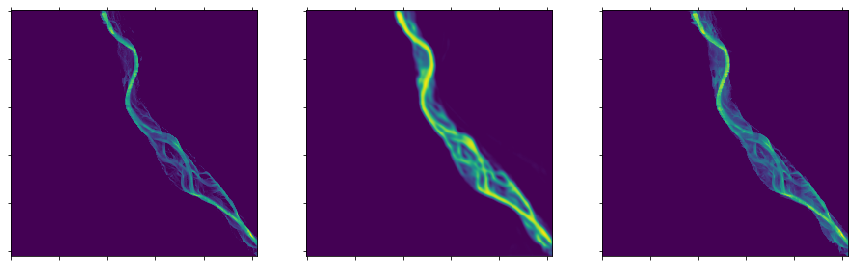

epoch 42 -- avg loss: 28550.69941617873
[!] Comparison matrices printed


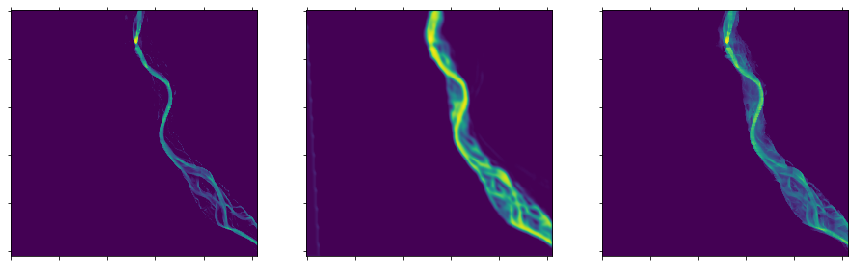

epoch 43 -- avg loss: 28141.600950761276
[!] Comparison matrices printed


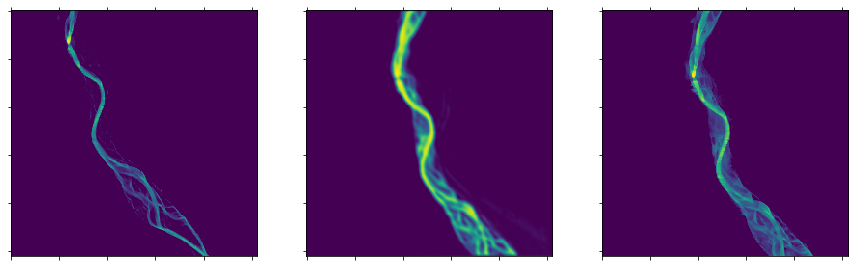

epoch 44 -- avg loss: 27748.061280776514
[!] Comparison matrices printed


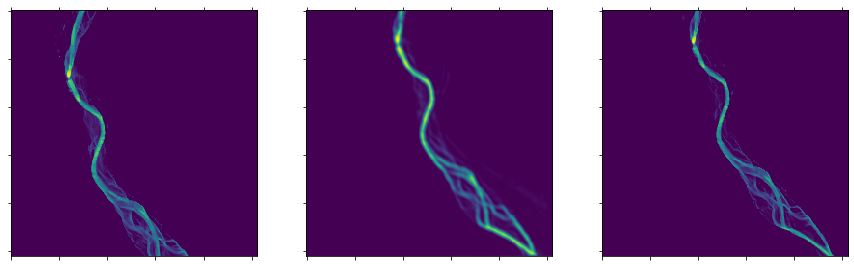

epoch 45 -- avg loss: 27369.221765450337
[!] Comparison matrices printed


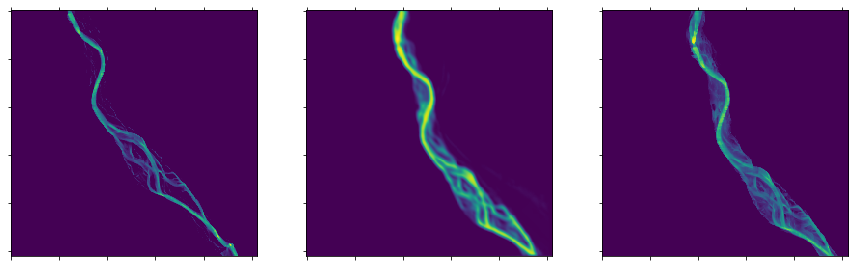

epoch 46 -- avg loss: 27004.27546889639
[!] Comparison matrices printed


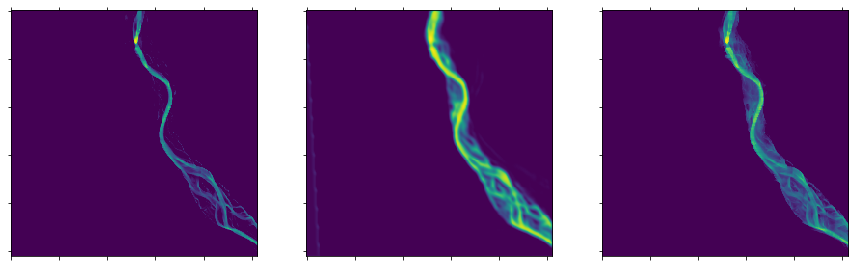

epoch 47 -- avg loss: 26652.46479254058
[!] Comparison matrices printed


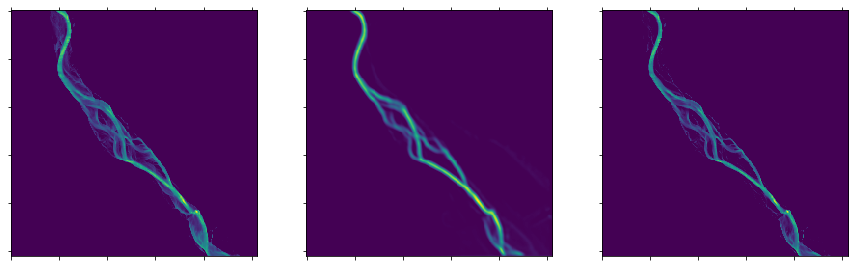

epoch 48 -- avg loss: 26313.082036119224
[!] Comparison matrices printed


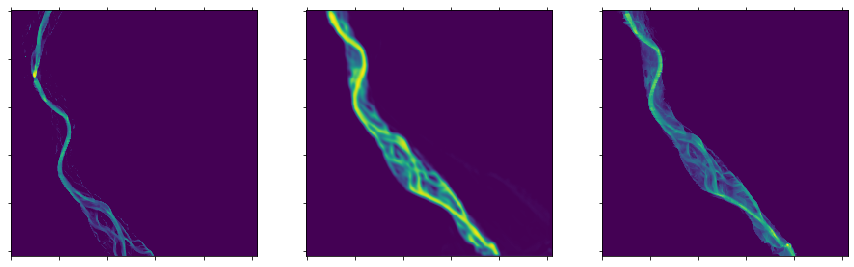

epoch 49 -- avg loss: 25985.465035178444
[!] Comparison matrices printed


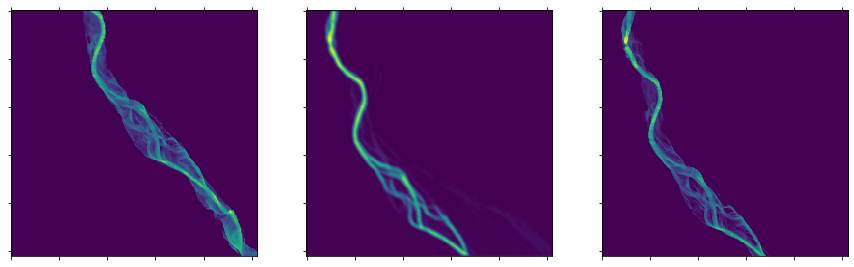

epoch 50 -- avg loss: 25668.99500469133
[!] Comparison matrices printed


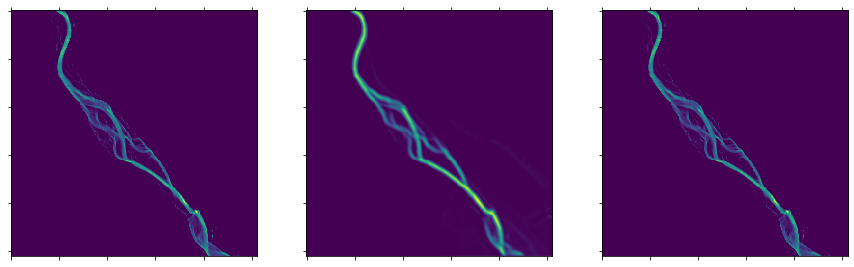

epoch 51 -- avg loss: 25363.09469849913
[!] Comparison matrices printed


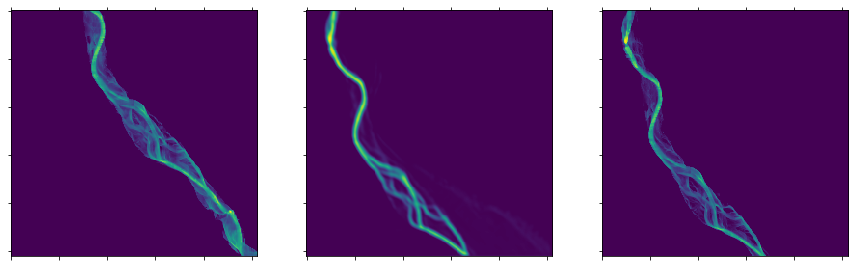

epoch 52 -- avg loss: 25067.223762525293
[!] Comparison matrices printed


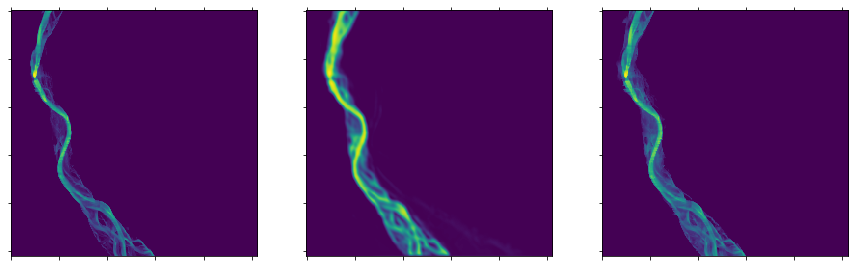

epoch 53 -- avg loss: 24780.87752956814
[!] Comparison matrices printed


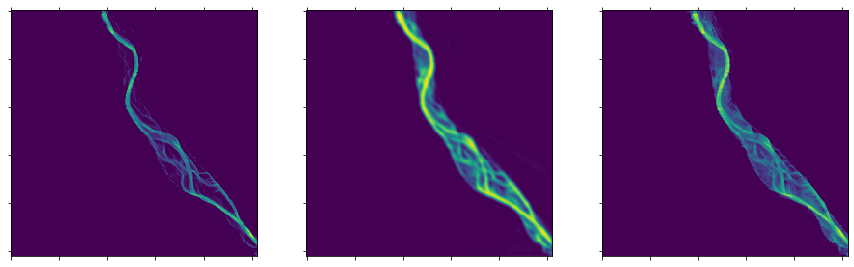

epoch 54 -- avg loss: 24503.583955219365
[!] Comparison matrices printed


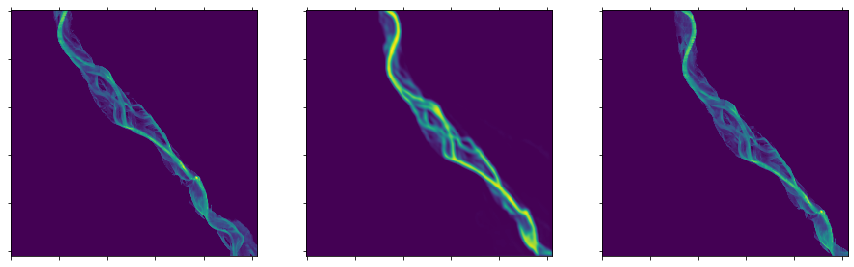

epoch 55 -- avg loss: 24234.90151165058
[!] Comparison matrices printed


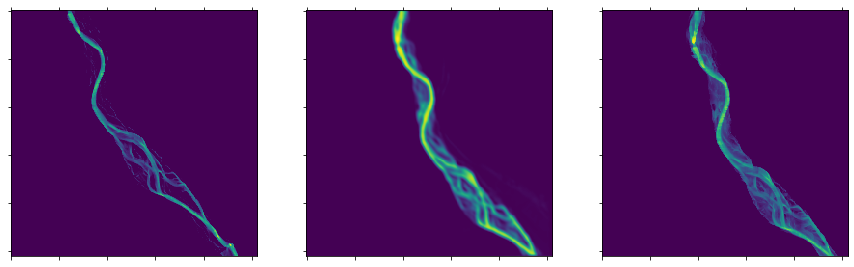

epoch 56 -- avg loss: 23974.416174199592
[!] Comparison matrices printed


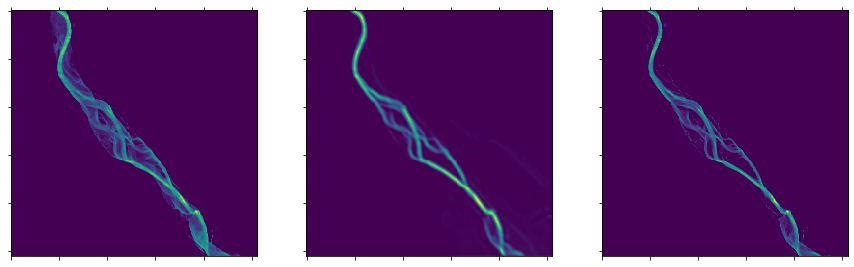

epoch 57 -- avg loss: 23721.740648610466
[!] Comparison matrices printed


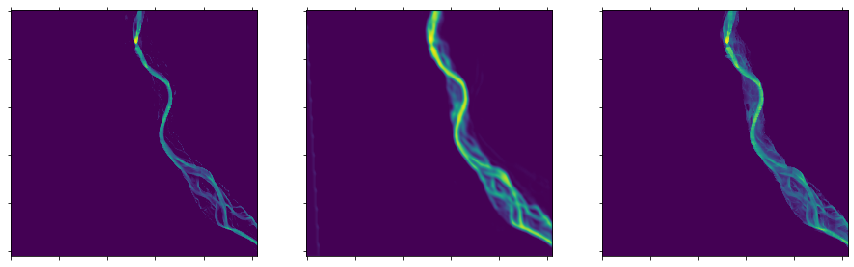

epoch 58 -- avg loss: 23476.512605217464
[!] Comparison matrices printed


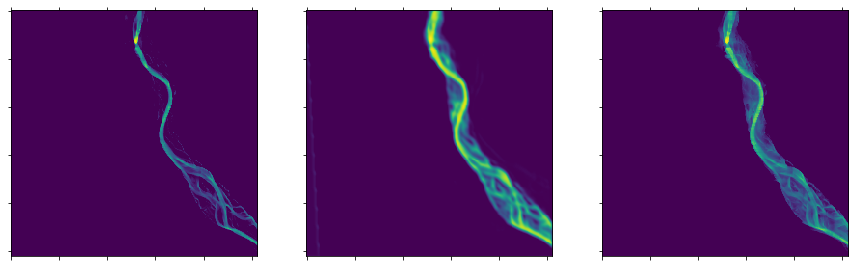

epoch 59 -- avg loss: 23238.392489993934
[!] Comparison matrices printed


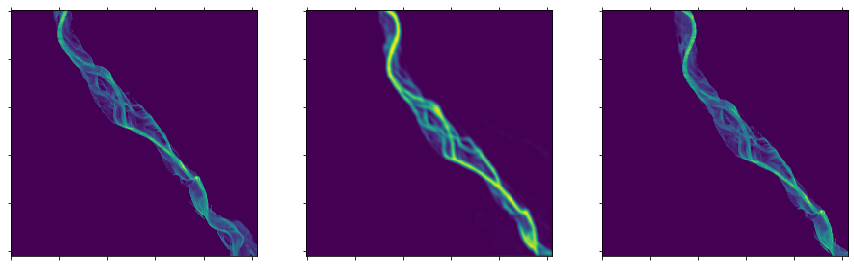

epoch 60 -- avg loss: 23007.063144916927
[!] Comparison matrices printed


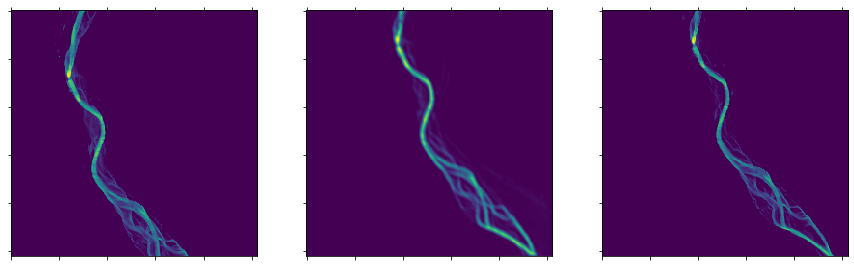

epoch 61 -- avg loss: 22782.228806302694
[!] Comparison matrices printed


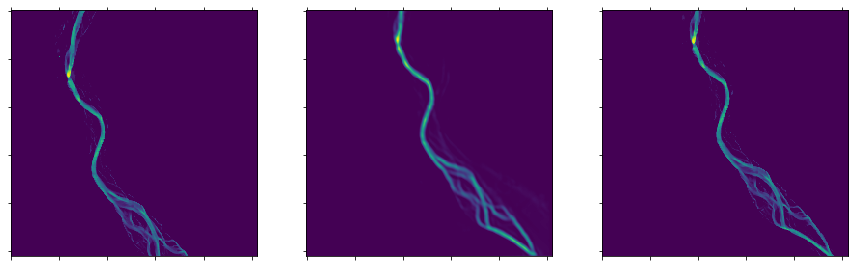

epoch 62 -- avg loss: 22563.61341617909
[!] Comparison matrices printed


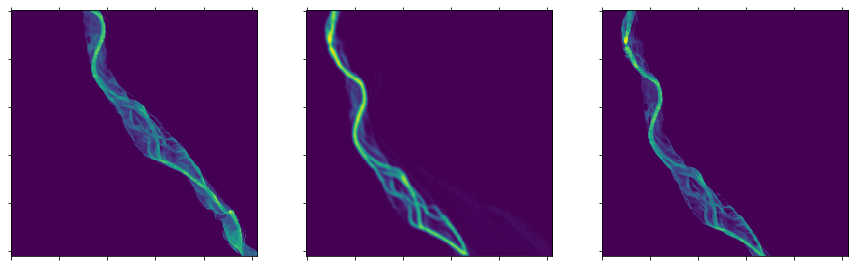

epoch 63 -- avg loss: 22350.958741014652
[!] Comparison matrices printed


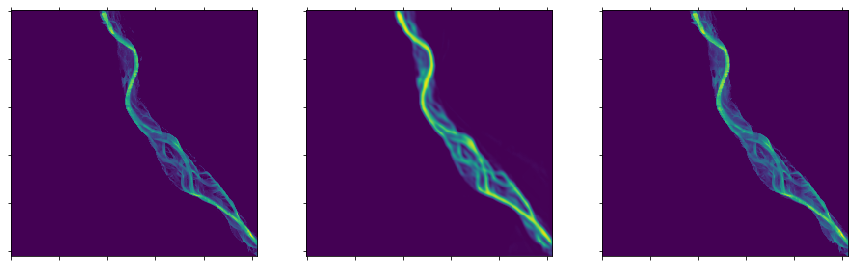

epoch 64 -- avg loss: 22144.023233651114
[!] Comparison matrices printed


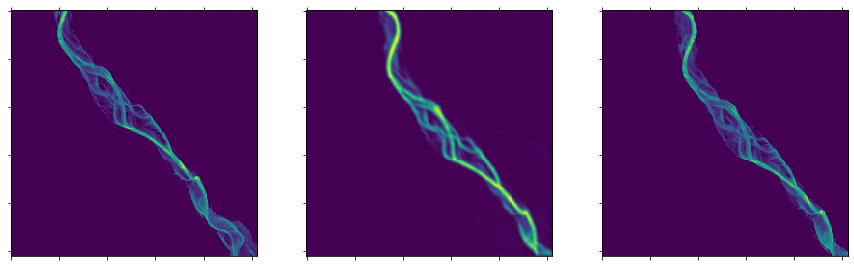

epoch 65 -- avg loss: 21942.57851332147
[!] Comparison matrices printed


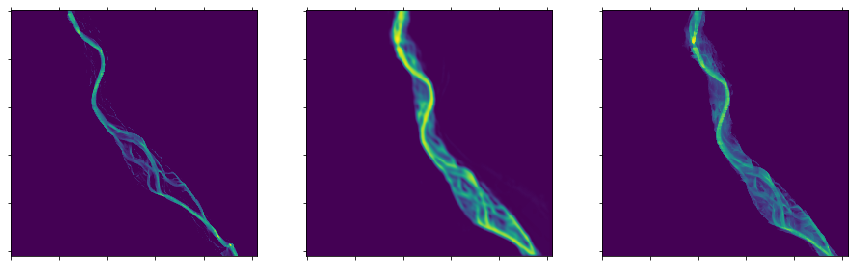

epoch 66 -- avg loss: 21746.408107555704
[!] Comparison matrices printed


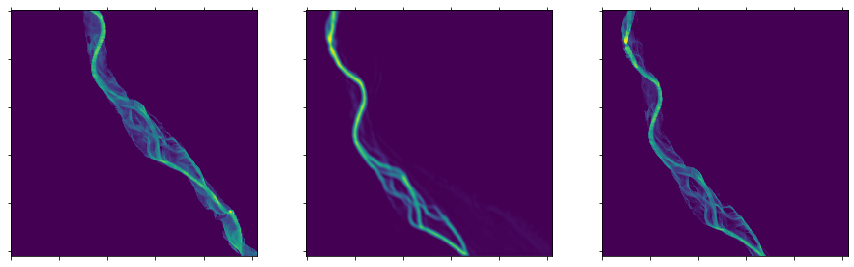

epoch 67 -- avg loss: 21555.306449114956
[!] Comparison matrices printed


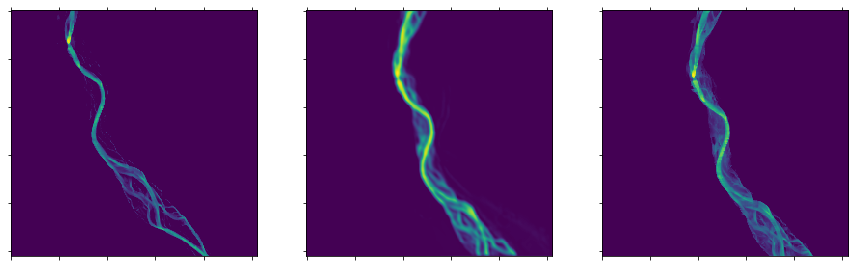

epoch 68 -- avg loss: 21369.07659566324
[!] Comparison matrices printed


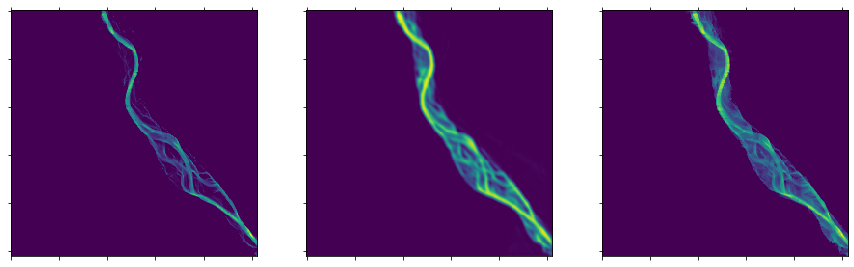

epoch 69 -- avg loss: 21187.531157099736
[!] Comparison matrices printed


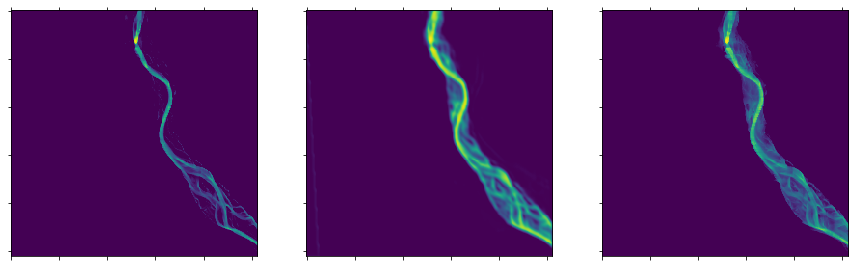

epoch 70 -- avg loss: 21010.49101743808
[!] Comparison matrices printed


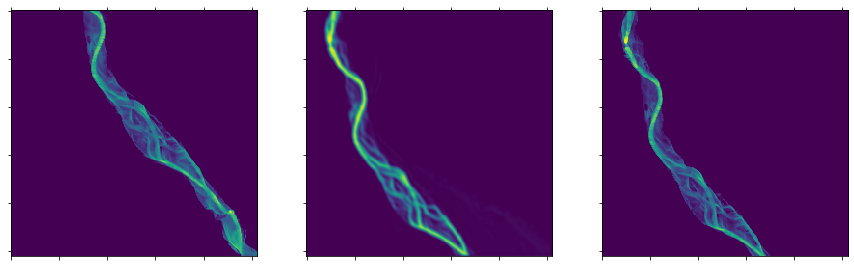

epoch 71 -- avg loss: 20837.786109076605
[!] Comparison matrices printed


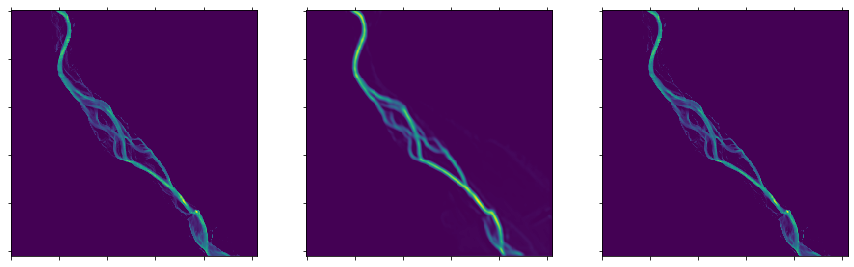

epoch 72 -- avg loss: 20669.254096728335
[!] Comparison matrices printed


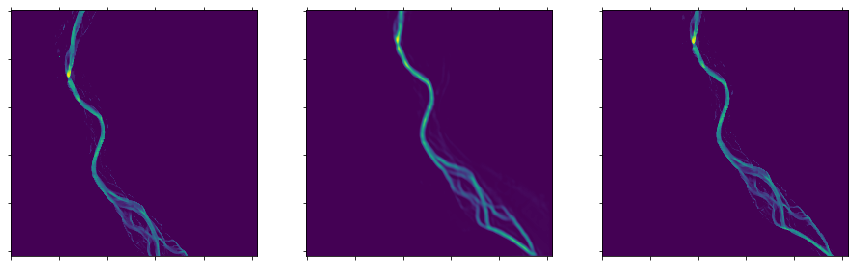

epoch 73 -- avg loss: 20504.74055702153
[!] Comparison matrices printed


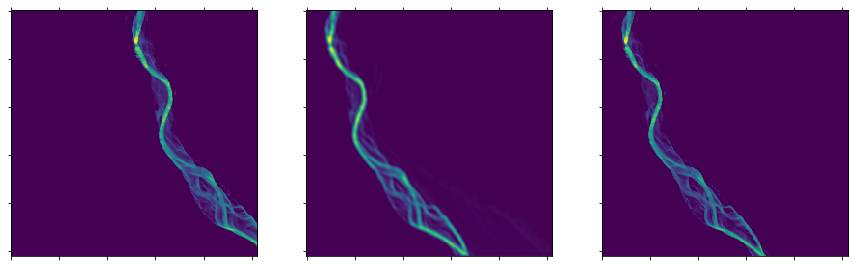

epoch 74 -- avg loss: 20344.09842470111
[!] Comparison matrices printed


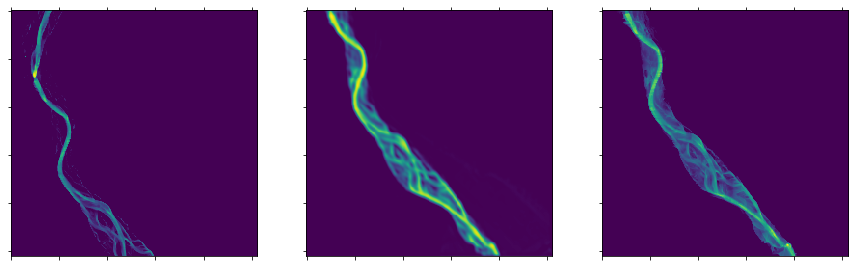

epoch 75 -- avg loss: 20187.1876952979
[!] Comparison matrices printed


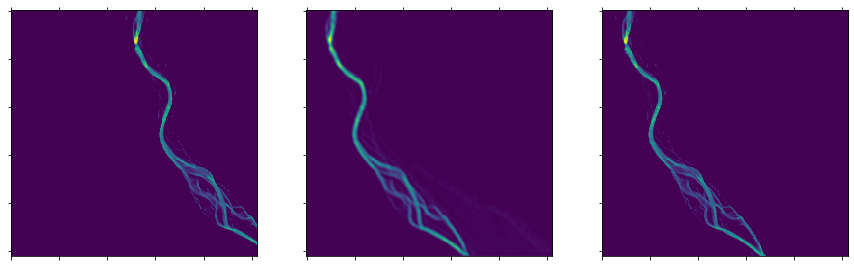

epoch 76 -- avg loss: 20033.875023131386
[!] Comparison matrices printed


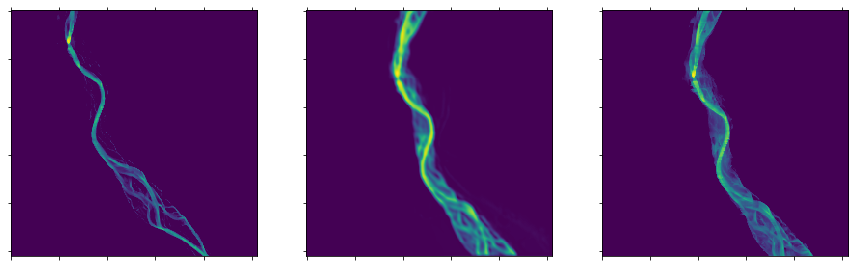

epoch 77 -- avg loss: 19884.033153258282
[!] Comparison matrices printed


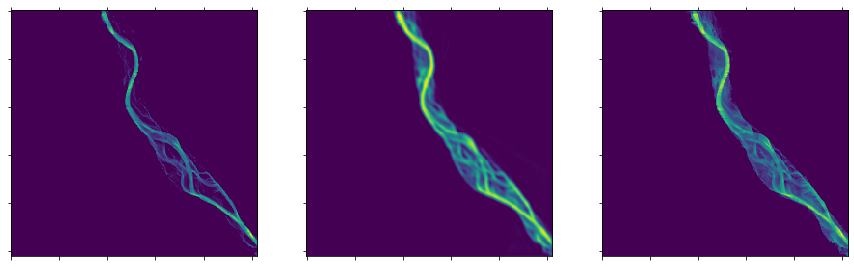

epoch 78 -- avg loss: 19737.54050100522
[!] Comparison matrices printed


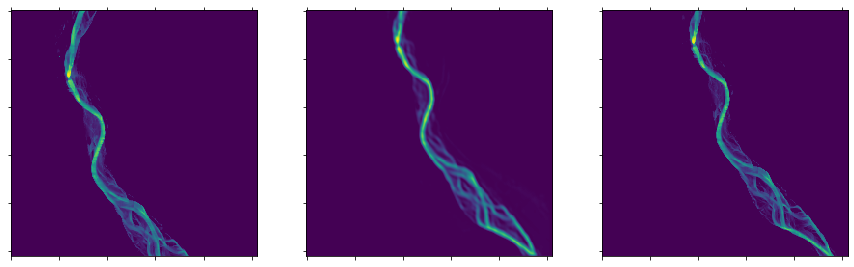

epoch 79 -- avg loss: 19594.280726970326
[!] Comparison matrices printed


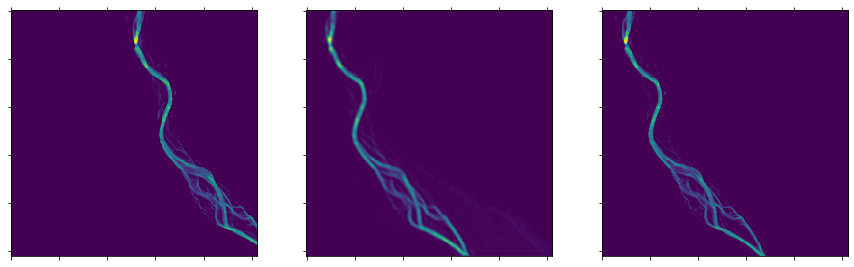

epoch 80 -- avg loss: 19454.143095040028
[!] Comparison matrices printed


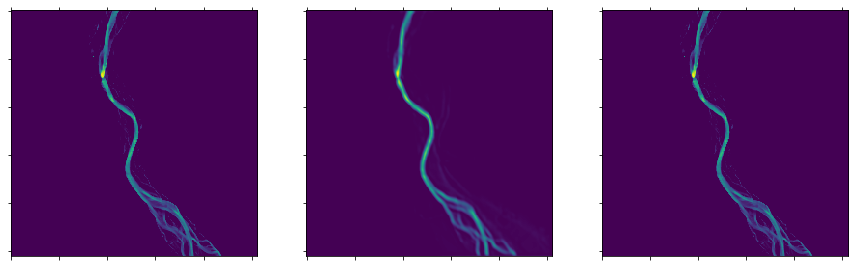

epoch 81 -- avg loss: 19317.021281646255
[!] Comparison matrices printed


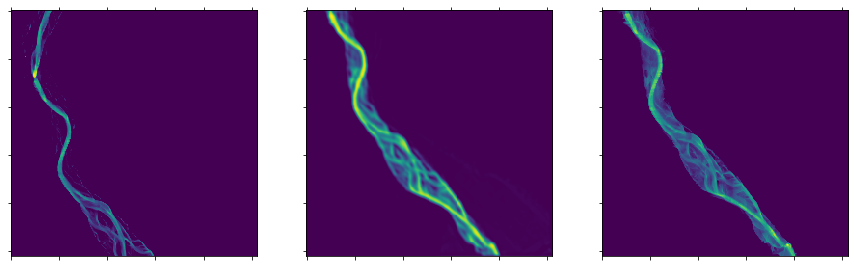

epoch 82 -- avg loss: 19182.814115192126
[!] Comparison matrices printed


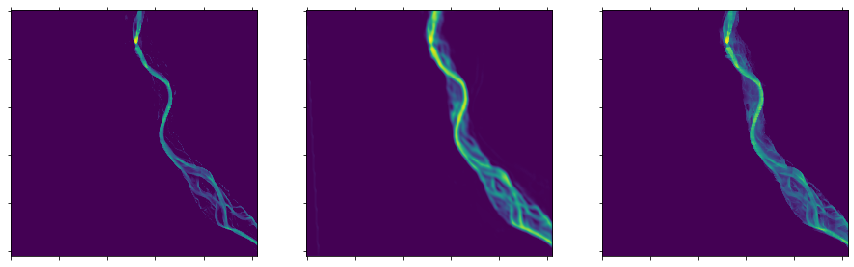

epoch 83 -- avg loss: 19051.424149748567
[!] Comparison matrices printed


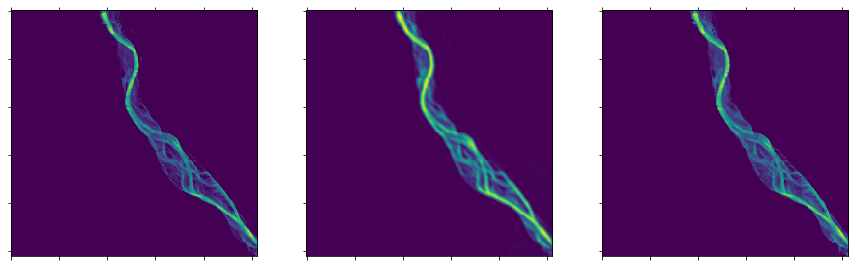

epoch 84 -- avg loss: 18922.758597111828
[!] Comparison matrices printed


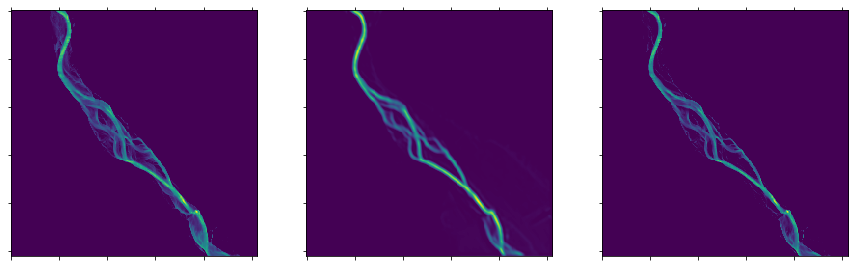

epoch 85 -- avg loss: 18796.728163640546
[!] Comparison matrices printed


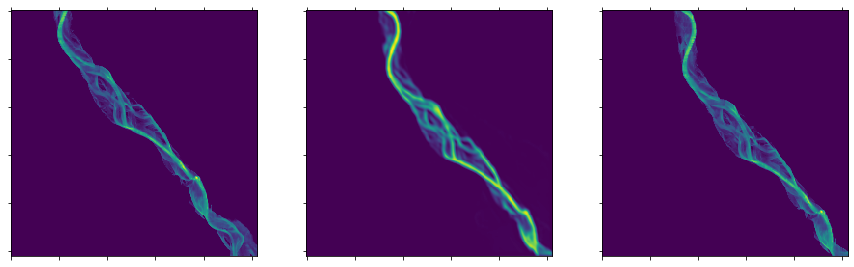

epoch 86 -- avg loss: 18673.24760419473
[!] Comparison matrices printed


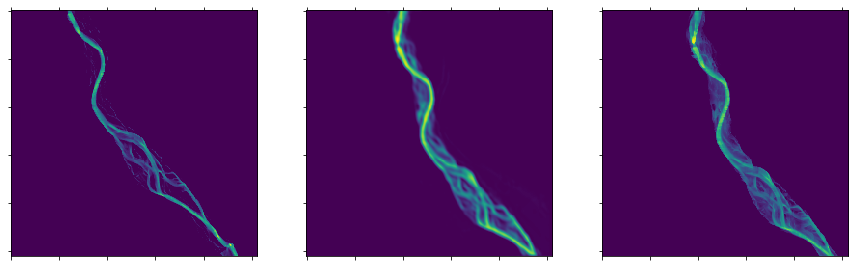

epoch 87 -- avg loss: 18552.235736121816
[!] Comparison matrices printed


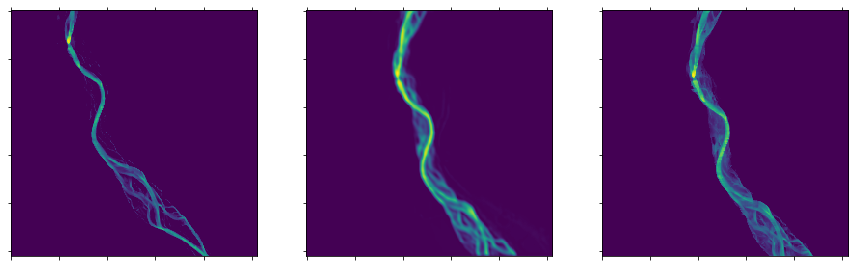

epoch 88 -- avg loss: 18433.614479103908
[!] Comparison matrices printed


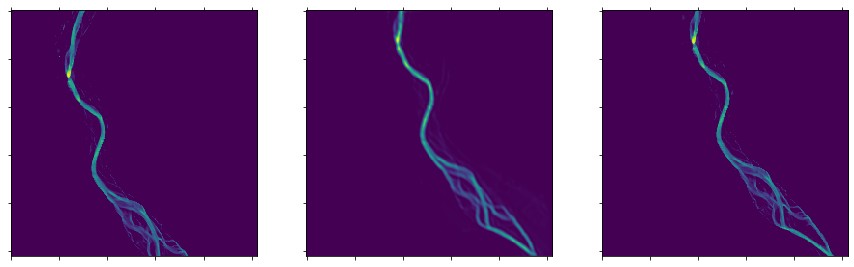

epoch 89 -- avg loss: 18317.3090756503
[!] Comparison matrices printed


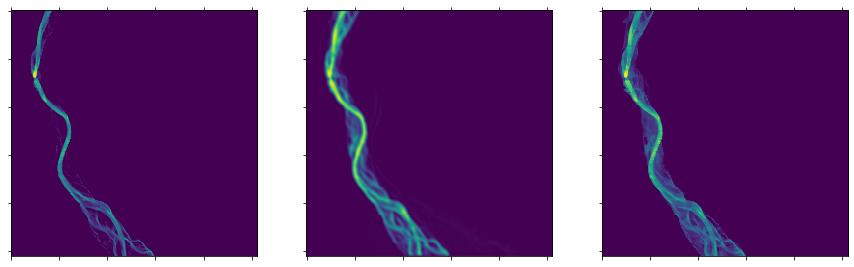

epoch 90 -- avg loss: 18203.2477726741
[!] Comparison matrices printed


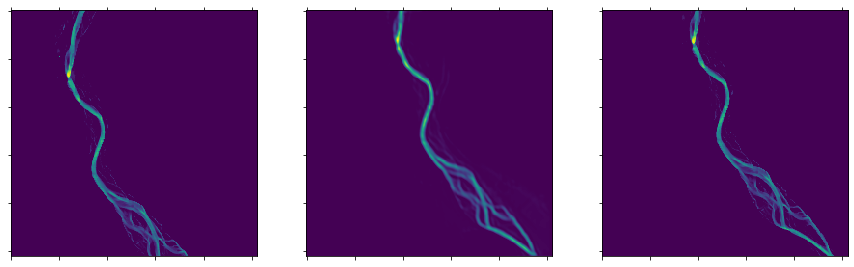

epoch 91 -- avg loss: 18091.362252729214
[!] Comparison matrices printed


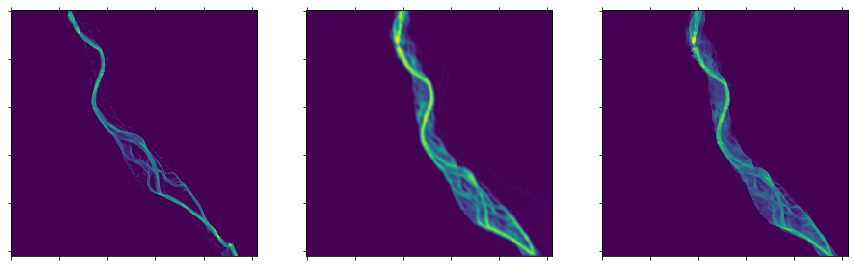

epoch 92 -- avg loss: 17981.586697665127
[!] Comparison matrices printed


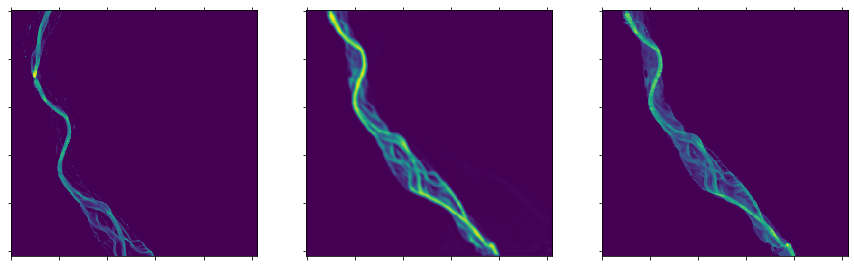

epoch 93 -- avg loss: 17873.85811775842
[!] Comparison matrices printed


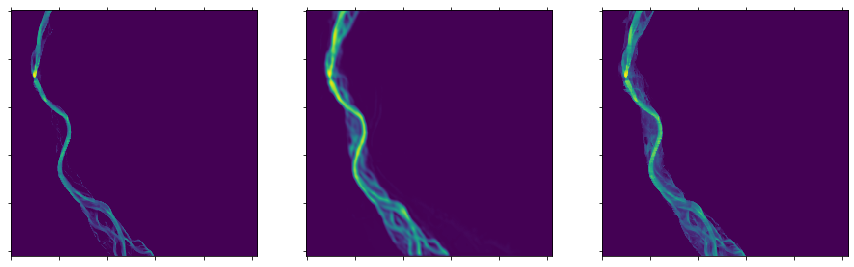

epoch 94 -- avg loss: 17768.115865460994
[!] Comparison matrices printed


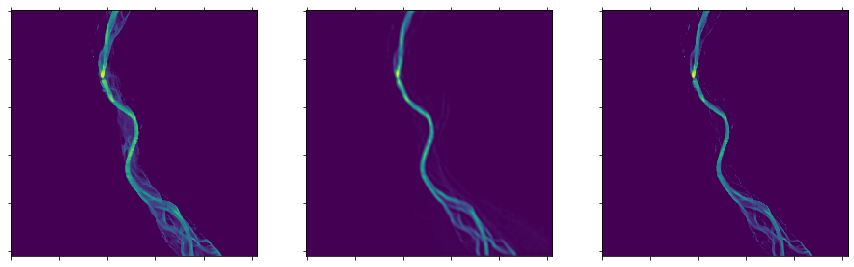

epoch 95 -- avg loss: 17664.301874825447
[!] Comparison matrices printed


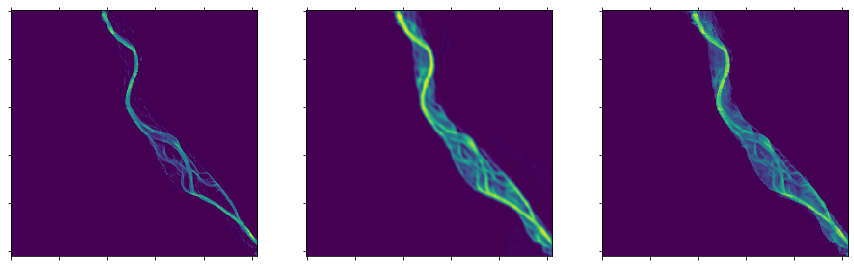

epoch 96 -- avg loss: 17562.360020102133
[!] Comparison matrices printed


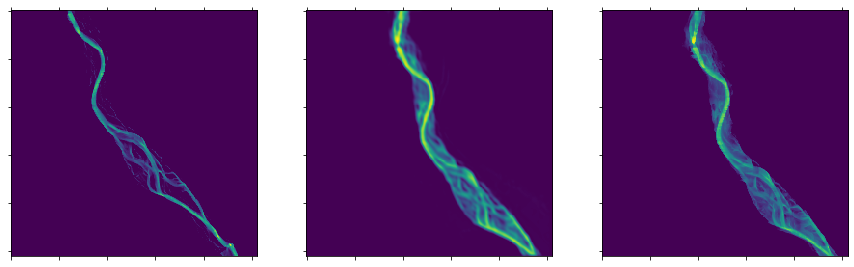

epoch 97 -- avg loss: 17462.236328464714
[!] Comparison matrices printed


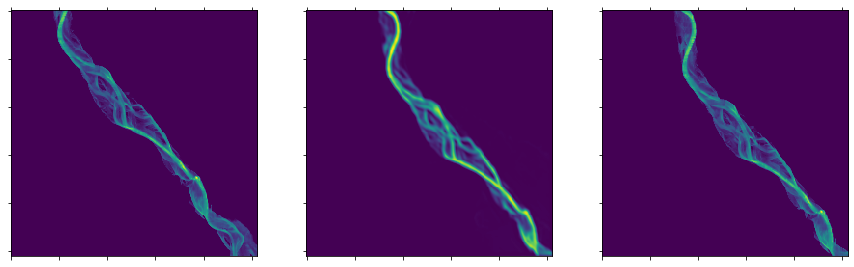

epoch 98 -- avg loss: 17363.87918539196
[!] Comparison matrices printed


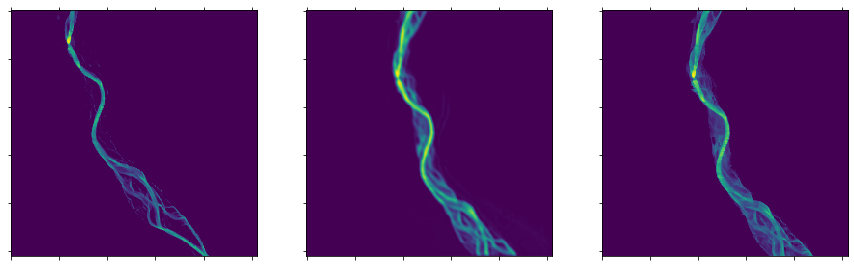

epoch 99 -- avg loss: 17267.238662941672
[!] Comparison matrices printed


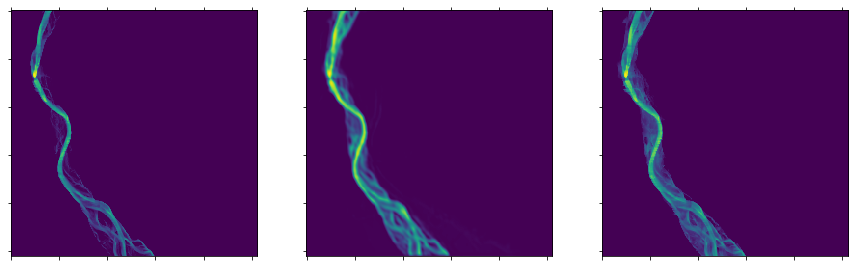

epoch 100 -- avg loss: 17172.26698958348
[!] Comparison matrices printed


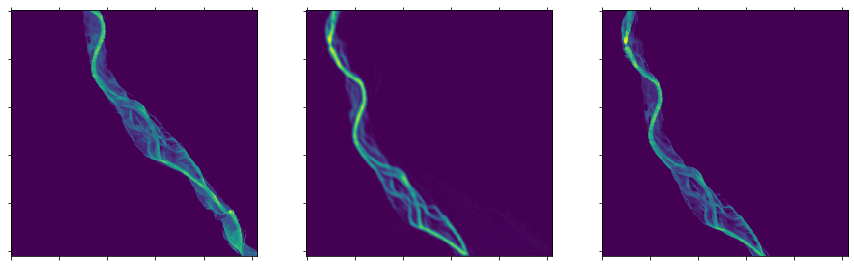

epoch 101 -- avg loss: 17078.918091881085
[!] Comparison matrices printed


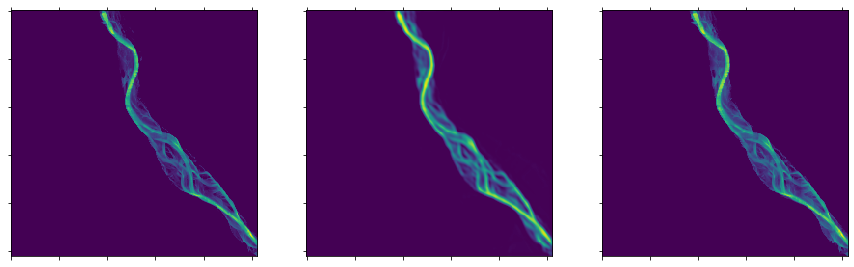

epoch 102 -- avg loss: 16987.147901166358
[!] Comparison matrices printed


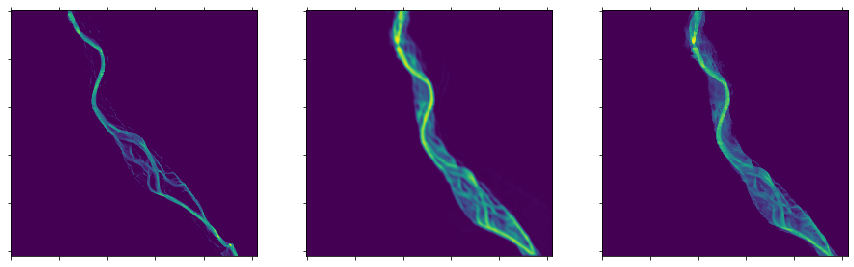

epoch 103 -- avg loss: 16896.913765647194
[!] Comparison matrices printed


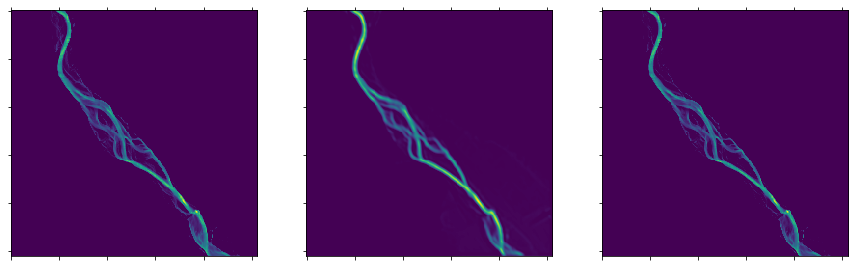

epoch 104 -- avg loss: 16808.17481182148
[!] Comparison matrices printed


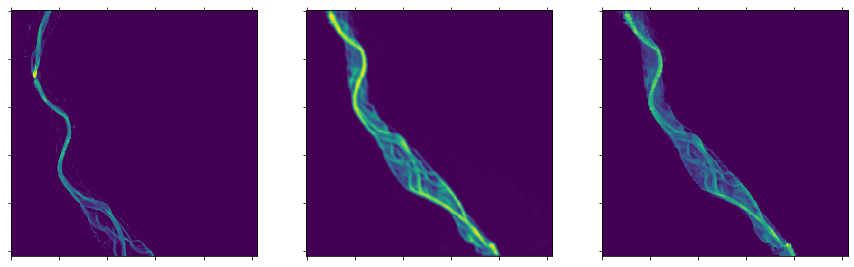

epoch 105 -- avg loss: 16720.89176134793
[!] Comparison matrices printed


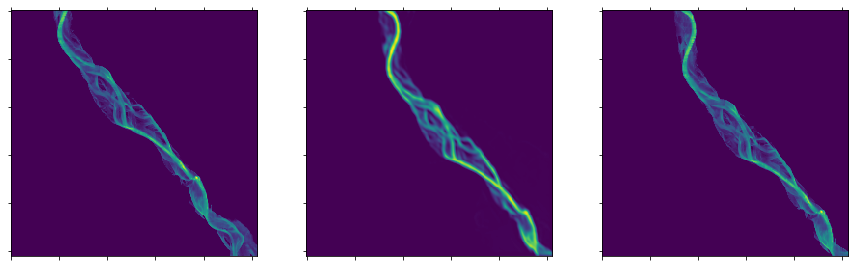

epoch 106 -- avg loss: 16635.026463848106
[!] Comparison matrices printed


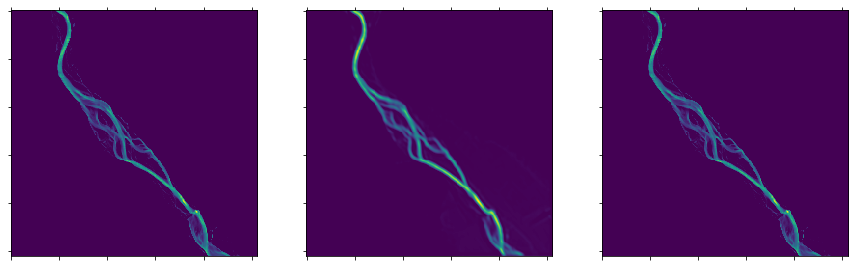

epoch 107 -- avg loss: 16550.5423956977
[!] Comparison matrices printed


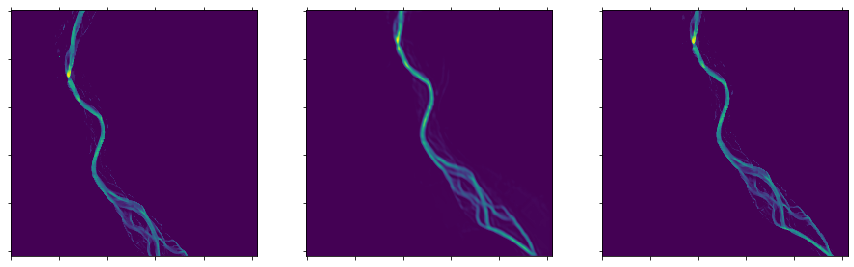

epoch 108 -- avg loss: 16467.404486903557
[!] Comparison matrices printed


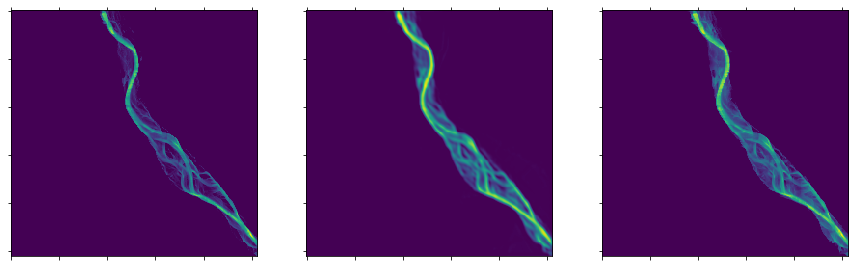

epoch 109 -- avg loss: 16385.578781279255
[!] Comparison matrices printed


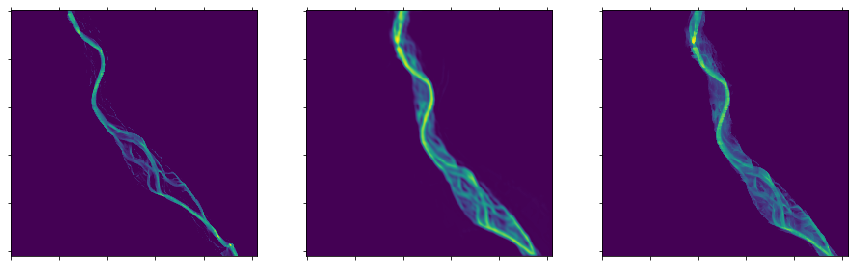

epoch 110 -- avg loss: 16305.03239559639
[!] Comparison matrices printed


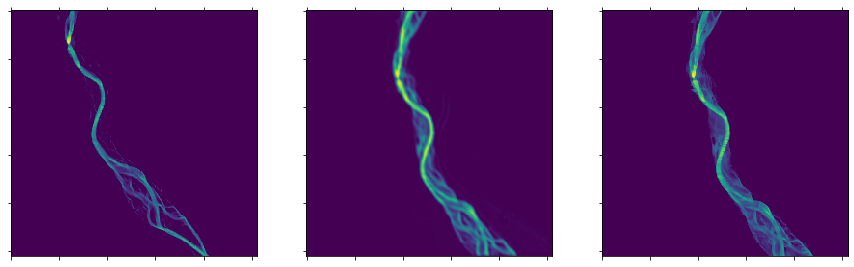

epoch 111 -- avg loss: 16225.733771633792
[!] Comparison matrices printed


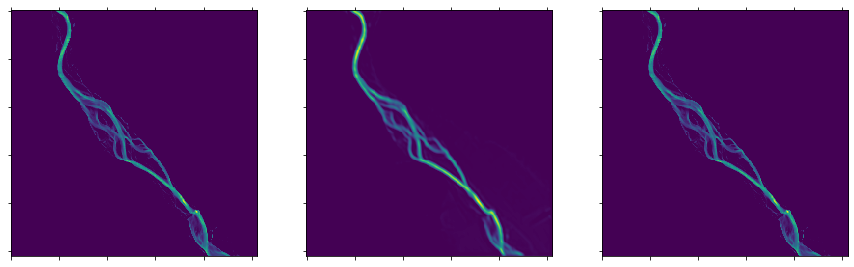

epoch 112 -- avg loss: 16147.652362630142
[!] Comparison matrices printed


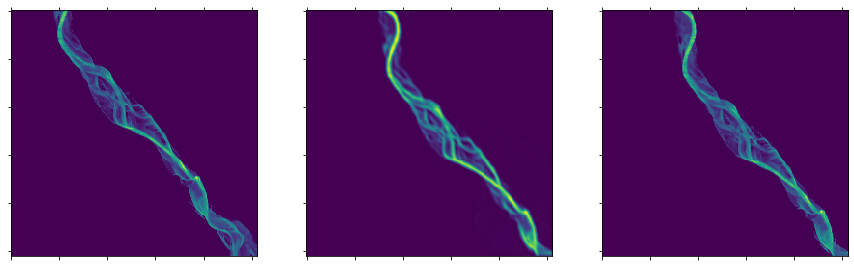

epoch 113 -- avg loss: 16070.758796217338
[!] Comparison matrices printed


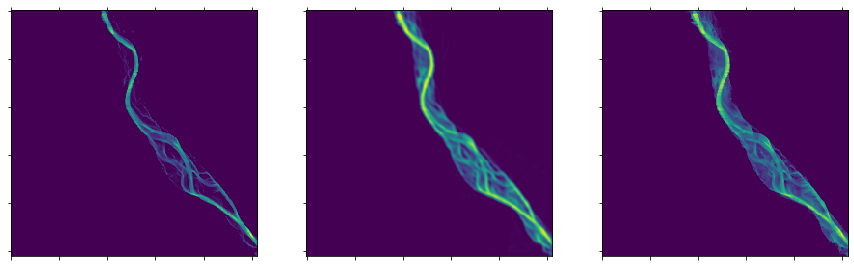

epoch 114 -- avg loss: 15995.024355246804
[!] Comparison matrices printed


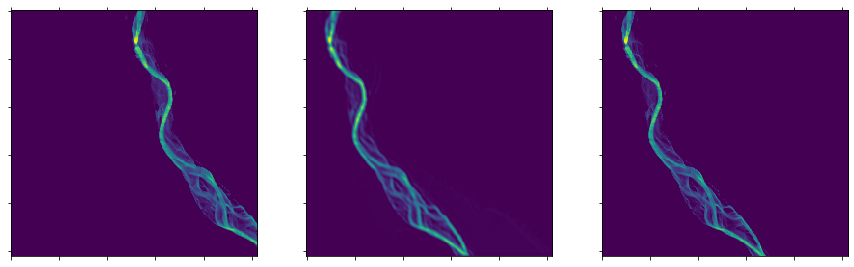

epoch 115 -- avg loss: 15920.421558439919
[!] Comparison matrices printed


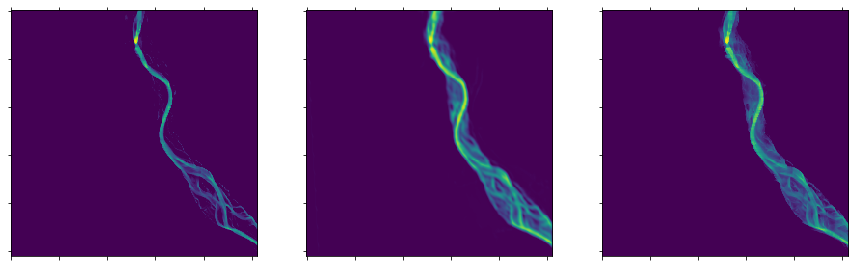

epoch 116 -- avg loss: 15846.923728865806
[!] Comparison matrices printed


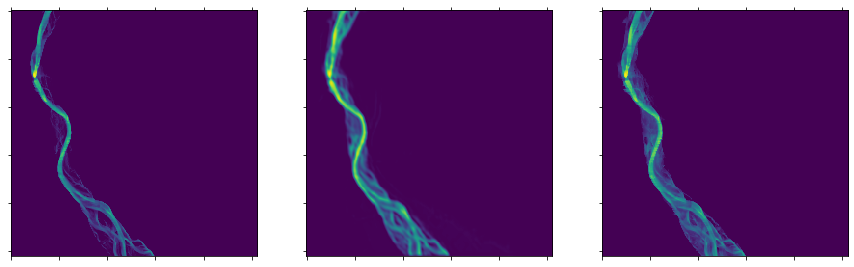

epoch 117 -- avg loss: 15774.505087853948
[!] Comparison matrices printed


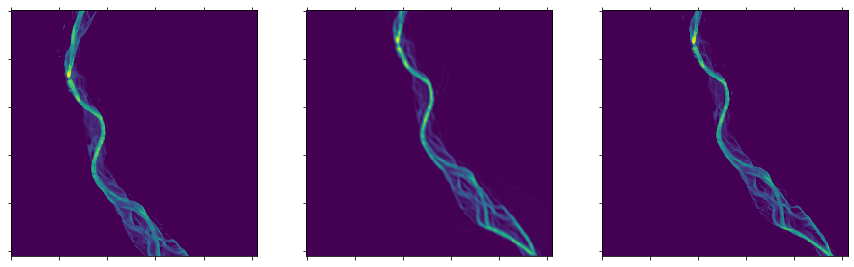

epoch 118 -- avg loss: 15703.140623997513
[!] Comparison matrices printed


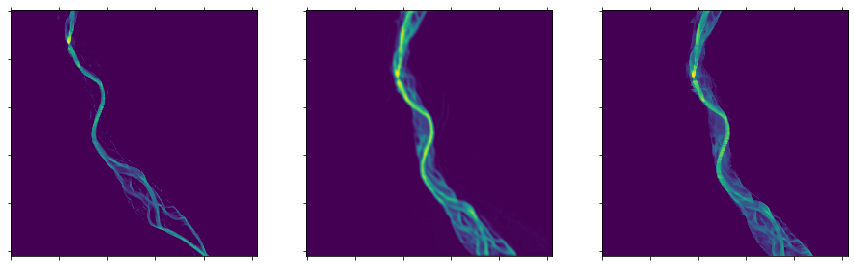

epoch 119 -- avg loss: 15632.806059080182
[!] Comparison matrices printed


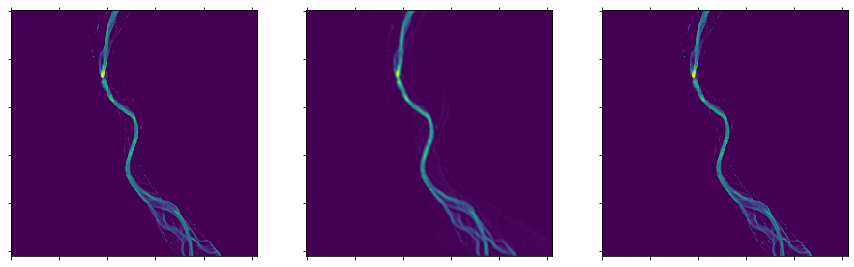

epoch 120 -- avg loss: 15563.477906236427
[!] Comparison matrices printed


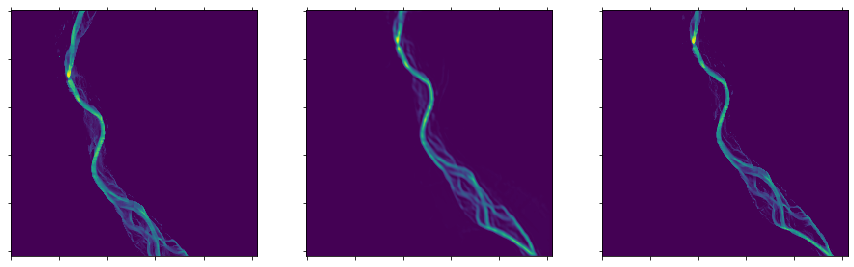

epoch 121 -- avg loss: 15495.133476132252
[!] Comparison matrices printed


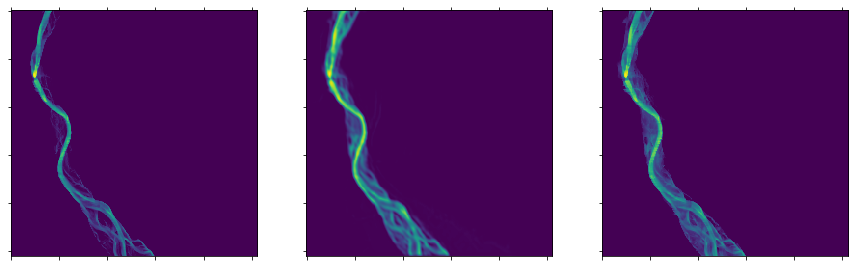

epoch 122 -- avg loss: 15427.750869153257
[!] Comparison matrices printed


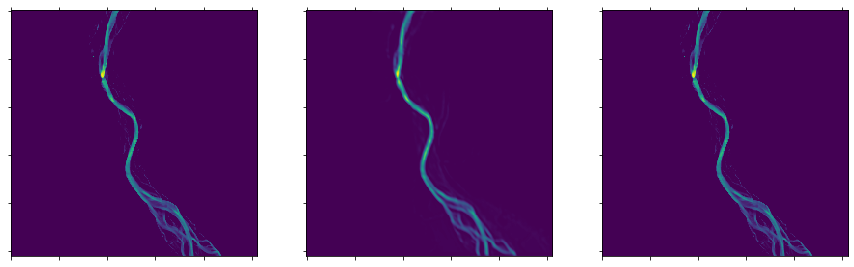

epoch 123 -- avg loss: 15361.308520096138
[!] Comparison matrices printed


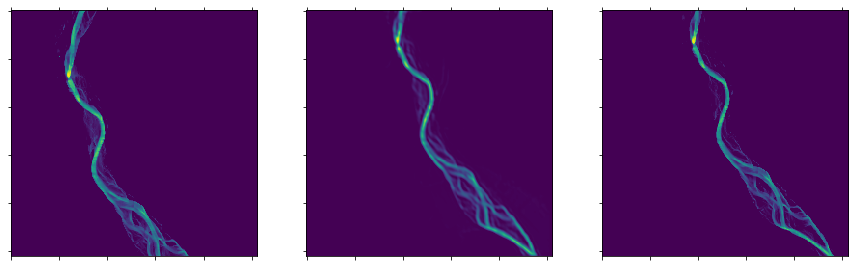

epoch 124 -- avg loss: 15295.785842995383
[!] Comparison matrices printed


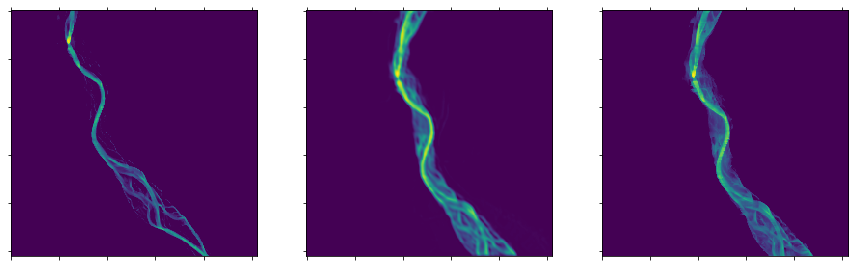

epoch 125 -- avg loss: 15231.162698148477
[!] Comparison matrices printed


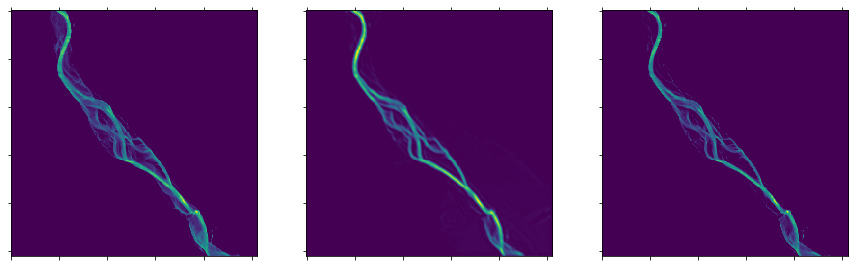

epoch 126 -- avg loss: 15167.41982341922
[!] Comparison matrices printed


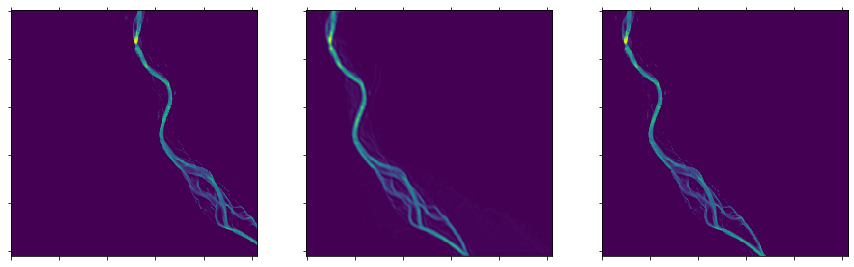

epoch 127 -- avg loss: 15104.5382196253
[!] Comparison matrices printed


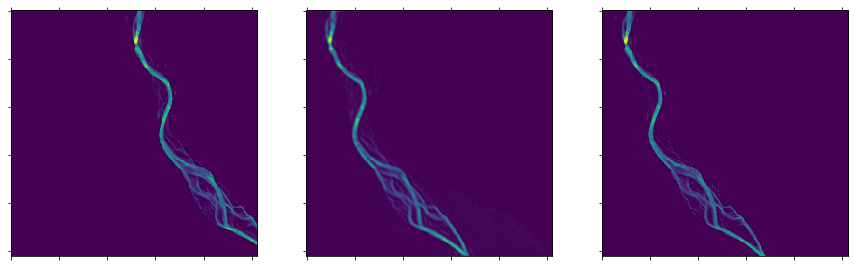

epoch 128 -- avg loss: 15042.499496148119
[!] Comparison matrices printed


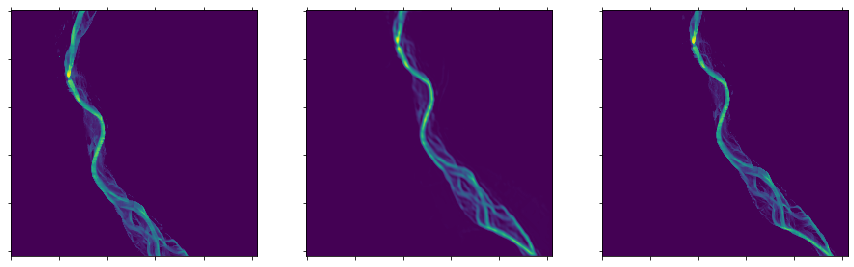

epoch 129 -- avg loss: 14981.285745452667
[!] Comparison matrices printed


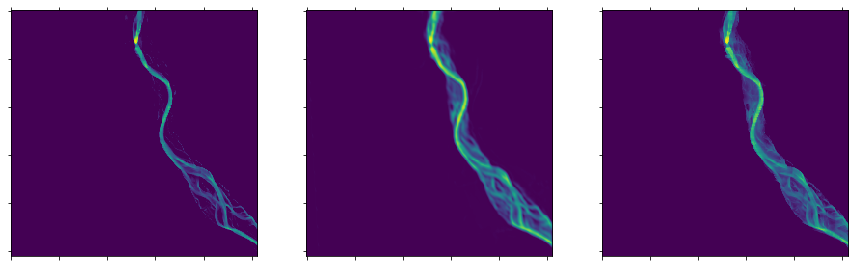

epoch 130 -- avg loss: 14920.87980102285
[!] Comparison matrices printed


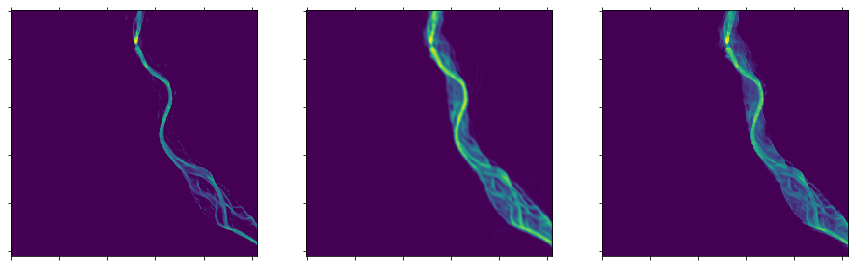

epoch 131 -- avg loss: 14861.265005652898
[!] Comparison matrices printed


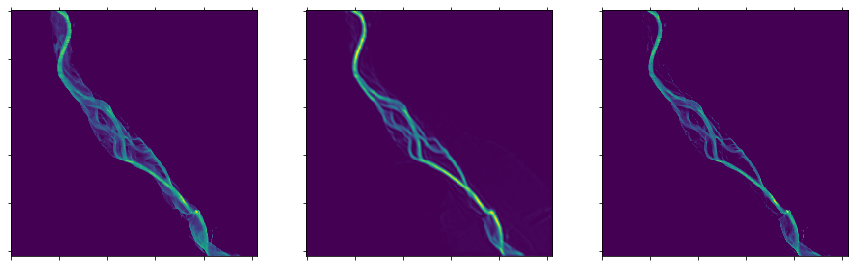

epoch 132 -- avg loss: 14802.425234541042
[!] Comparison matrices printed


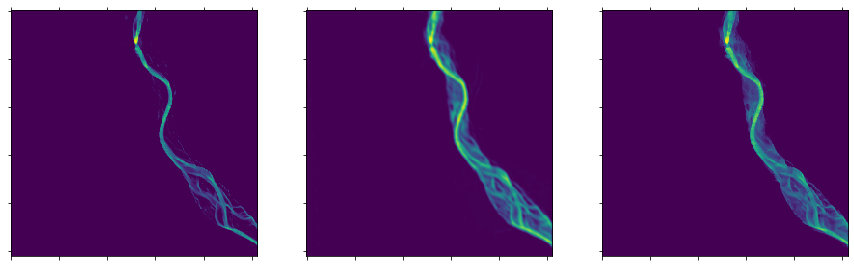

epoch 133 -- avg loss: 14744.344416252146
[!] Comparison matrices printed


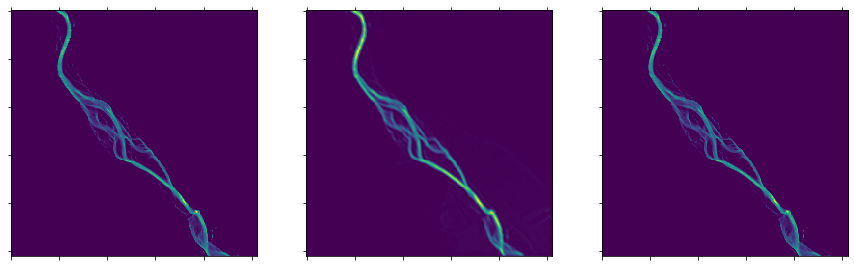

epoch 134 -- avg loss: 14687.007237598149
[!] Comparison matrices printed


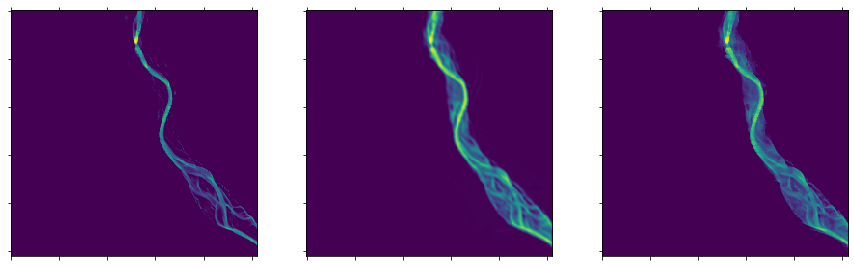

epoch 135 -- avg loss: 14630.398927963992
[!] Comparison matrices printed


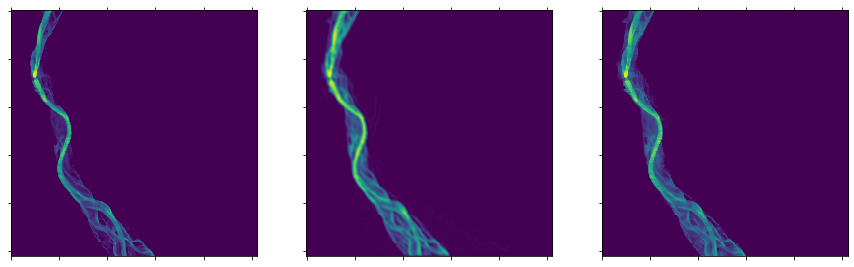

epoch 136 -- avg loss: 14574.50488129371
[!] Comparison matrices printed


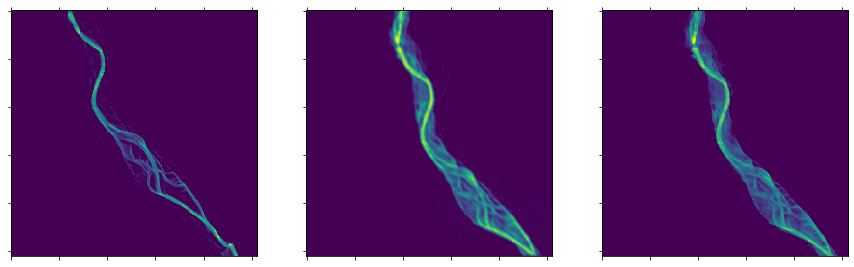

epoch 137 -- avg loss: 14519.311124216112
[!] Comparison matrices printed


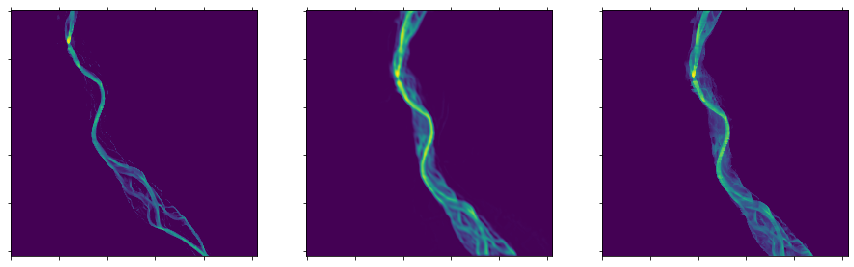

epoch 138 -- avg loss: 14464.803671717722
[!] Comparison matrices printed


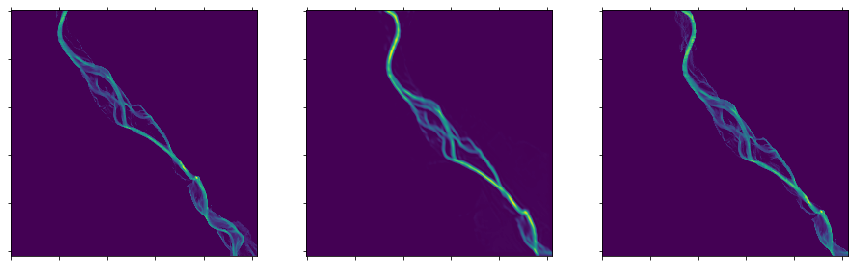

epoch 139 -- avg loss: 14410.96921045873
[!] Comparison matrices printed


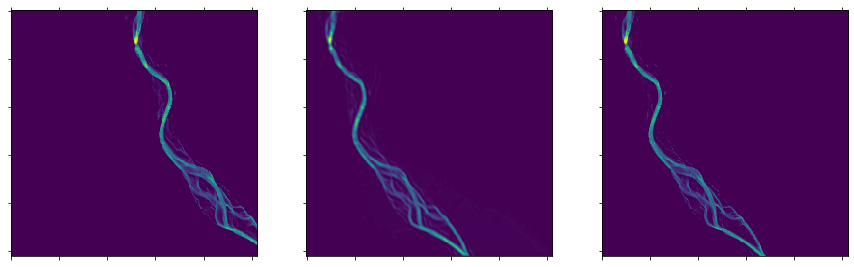

epoch 140 -- avg loss: 14357.794810626523
[!] Comparison matrices printed


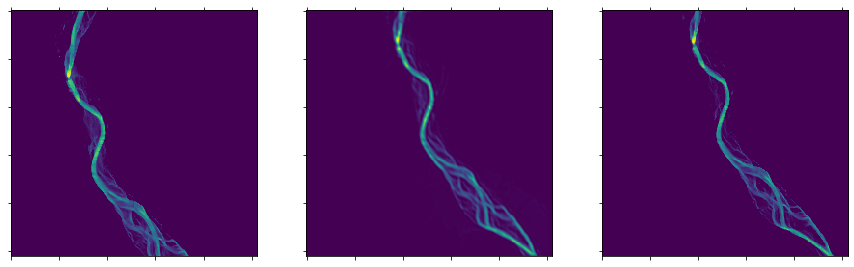

epoch 141 -- avg loss: 14305.2680669533
[!] Comparison matrices printed


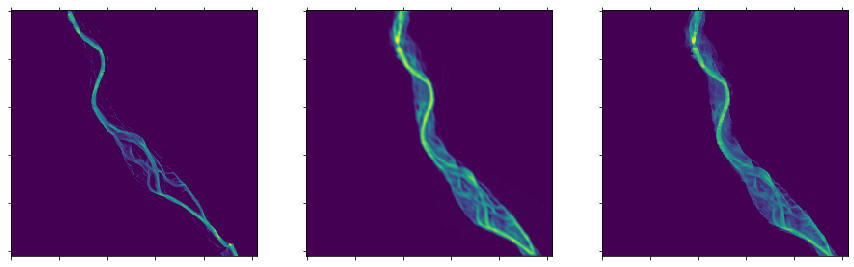

epoch 142 -- avg loss: 14253.376483643198
[!] Comparison matrices printed


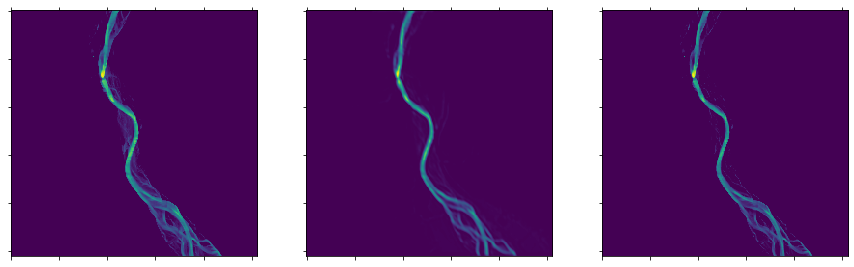

epoch 143 -- avg loss: 14202.108124183886
[!] Comparison matrices printed


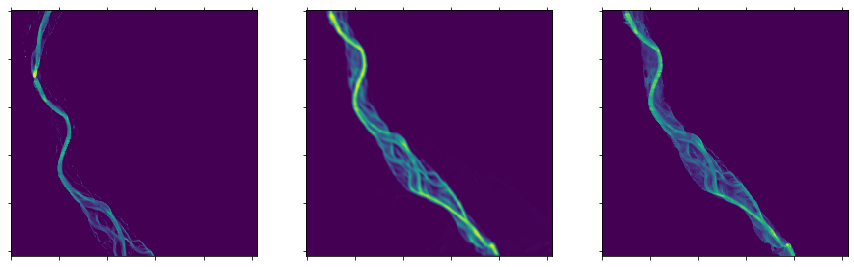

epoch 144 -- avg loss: 14151.451479098041
[!] Comparison matrices printed


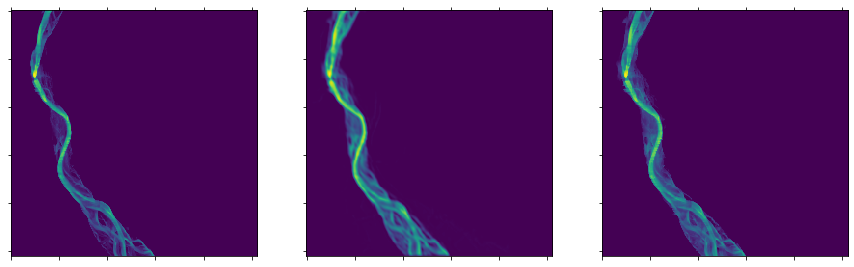

epoch 145 -- avg loss: 14101.395182665377
[!] Comparison matrices printed


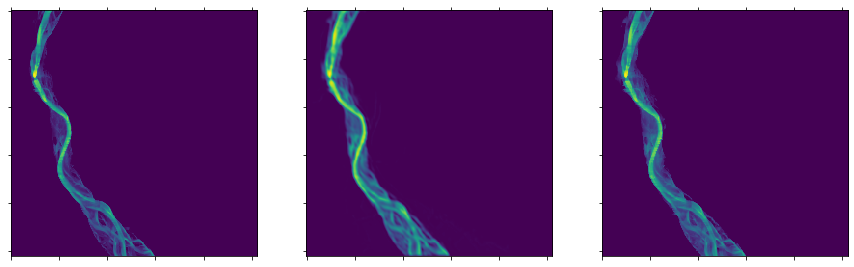

epoch 146 -- avg loss: 14051.928223203566
[!] Comparison matrices printed


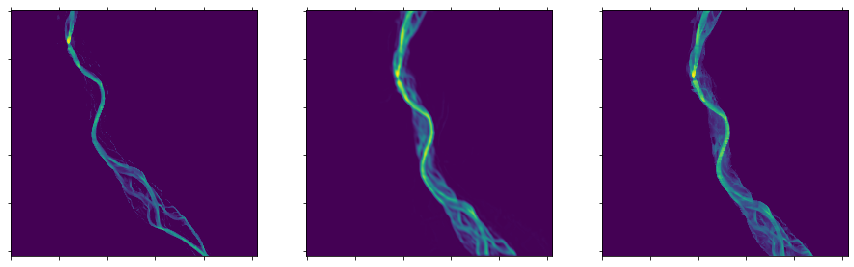

epoch 147 -- avg loss: 14003.039740166441
[!] Comparison matrices printed


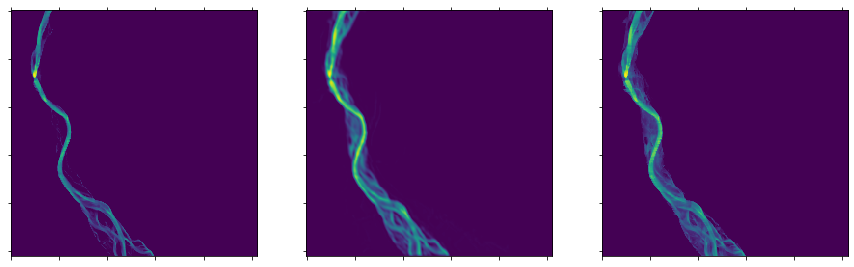

epoch 148 -- avg loss: 13954.719259749687
[!] Comparison matrices printed


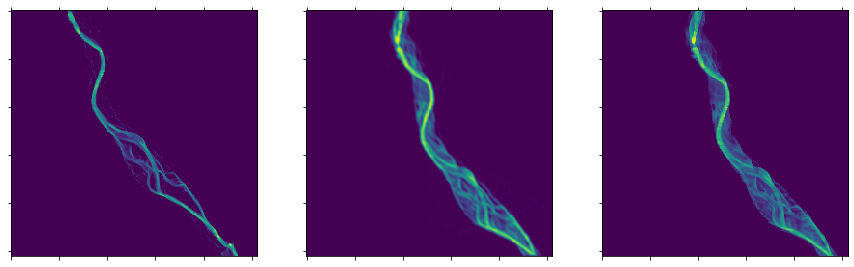

epoch 149 -- avg loss: 13906.956541618578
[!] Comparison matrices printed


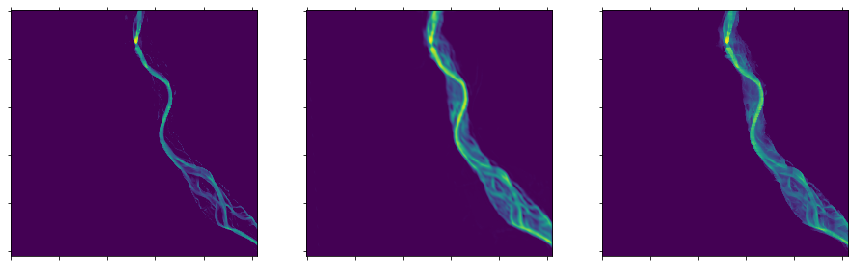

epoch 150 -- avg loss: 13859.741573437088
[!] Comparison matrices printed


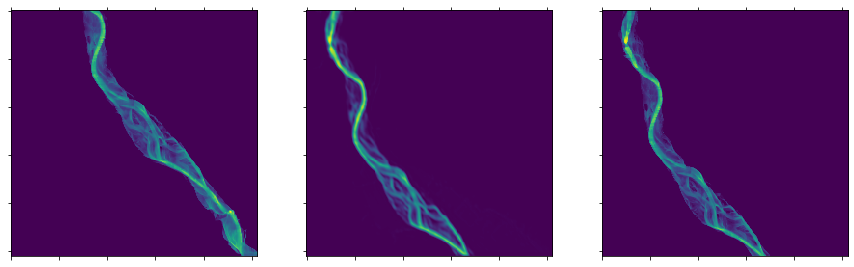

epoch 151 -- avg loss: 13813.064689143423
[!] Comparison matrices printed


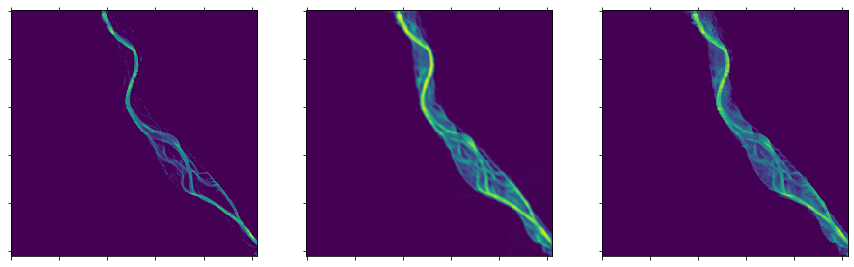

epoch 152 -- avg loss: 13766.916449398917
[!] Comparison matrices printed


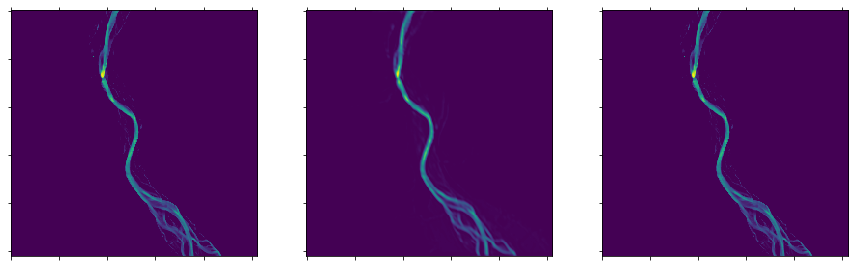

epoch 153 -- avg loss: 13721.28747774775
[!] Comparison matrices printed


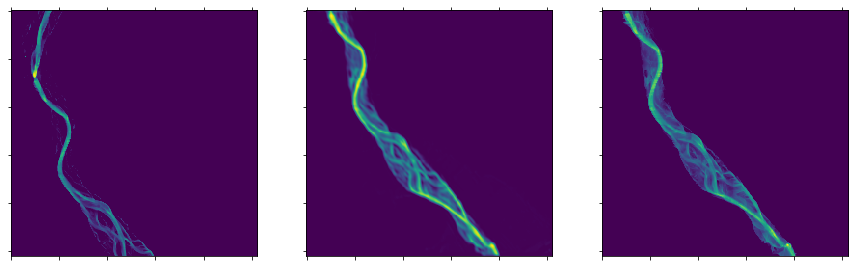

epoch 154 -- avg loss: 13676.168809513752
[!] Comparison matrices printed


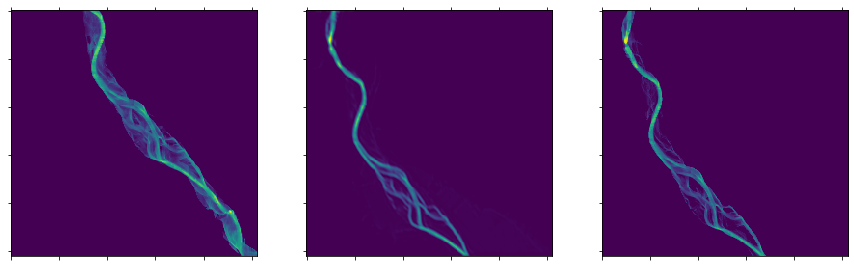

epoch 155 -- avg loss: 13631.551677961728
[!] Comparison matrices printed


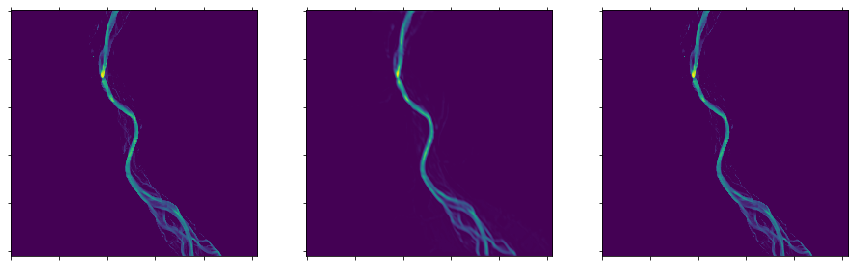

epoch 156 -- avg loss: 13587.42741796055
[!] Comparison matrices printed


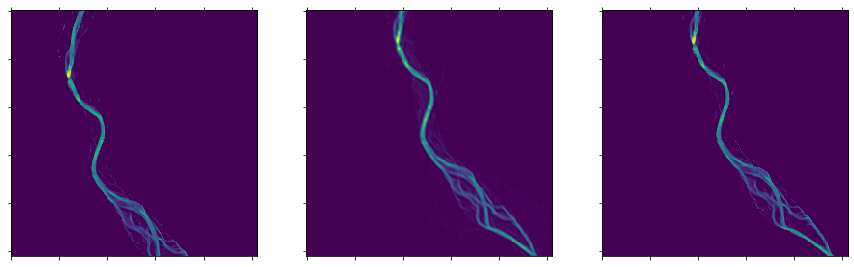

epoch 157 -- avg loss: 13543.78765019284
[!] Comparison matrices printed


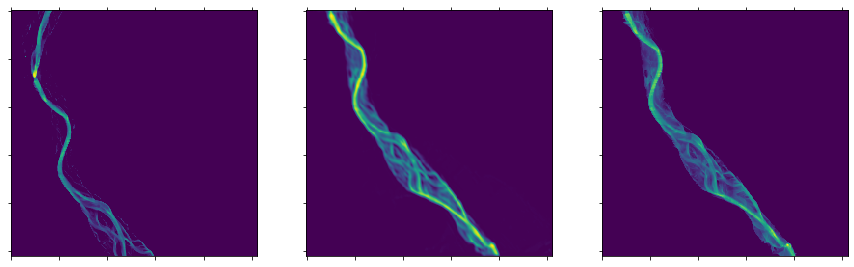

epoch 158 -- avg loss: 13500.624234408362
[!] Comparison matrices printed


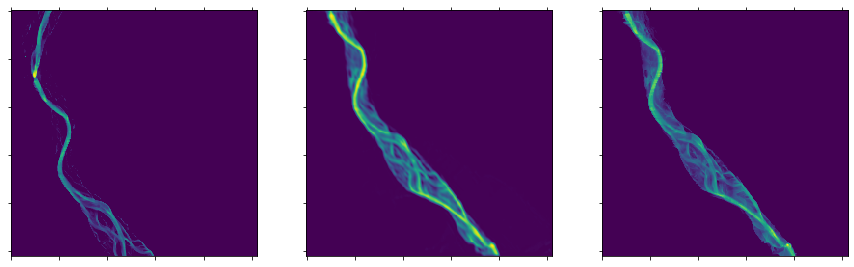

epoch 159 -- avg loss: 13457.929302198236
[!] Comparison matrices printed


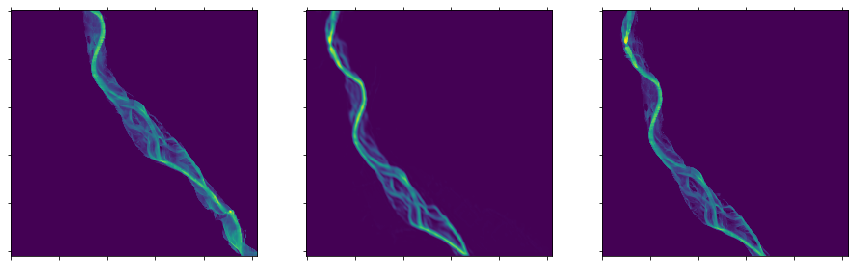

epoch 160 -- avg loss: 13415.694945031139
[!] Comparison matrices printed


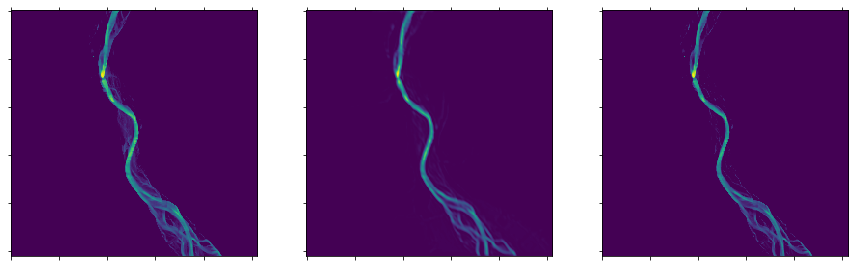

epoch 161 -- avg loss: 13373.913446925171
[!] Comparison matrices printed


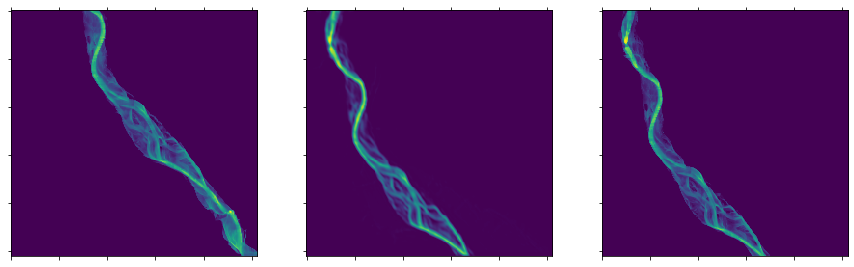

epoch 162 -- avg loss: 13332.577449017774
[!] Comparison matrices printed


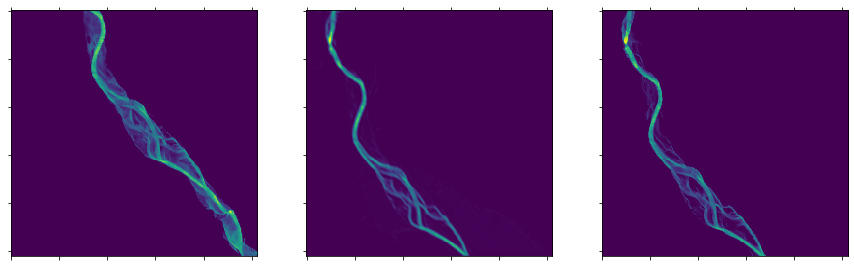

epoch 163 -- avg loss: 13291.679581009892
[!] Comparison matrices printed


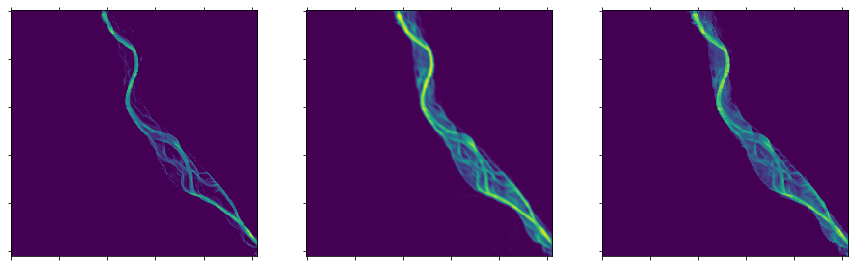

epoch 164 -- avg loss: 13251.212765914875
[!] Comparison matrices printed


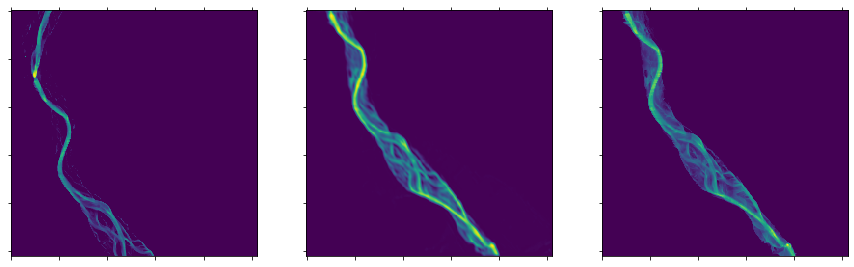

epoch 165 -- avg loss: 13211.170003851299
[!] Comparison matrices printed


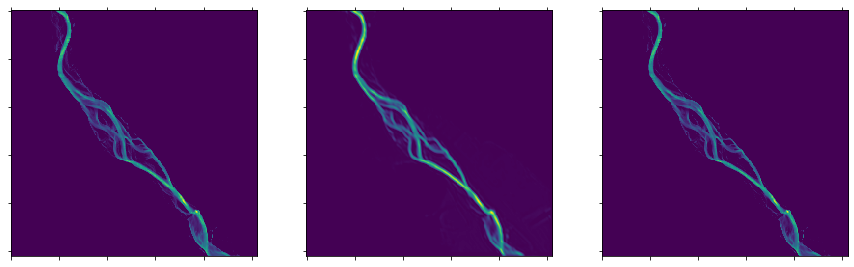

epoch 166 -- avg loss: 13171.54436485029
[!] Comparison matrices printed


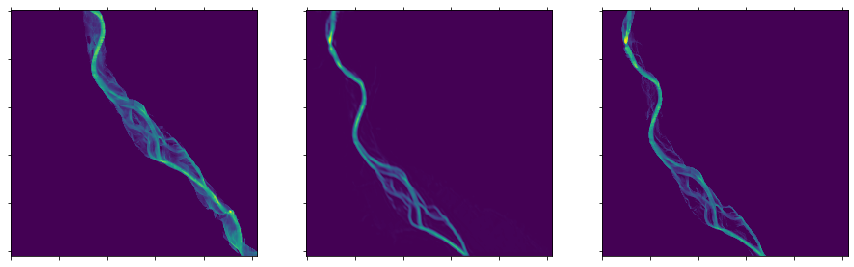

epoch 167 -- avg loss: 13132.32915328385
[!] Comparison matrices printed


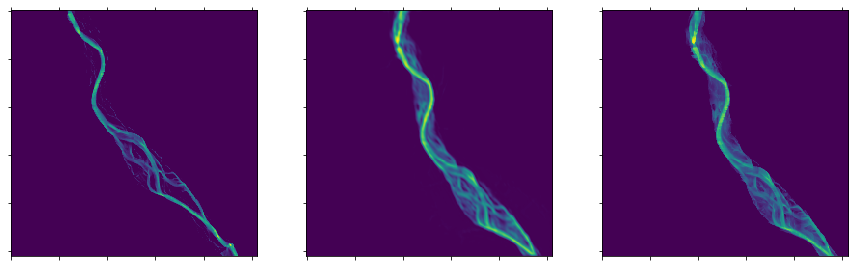

epoch 168 -- avg loss: 13093.51784784195
[!] Comparison matrices printed


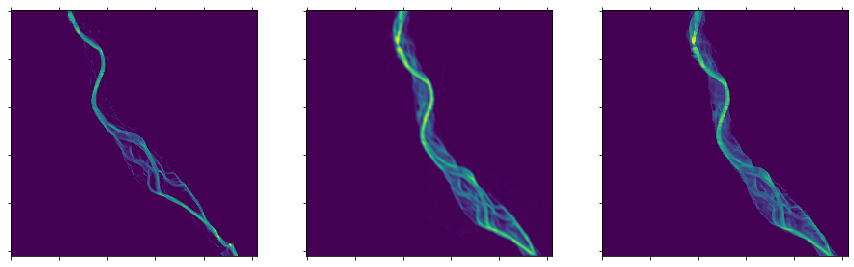

epoch 169 -- avg loss: 13055.104070277903
[!] Comparison matrices printed


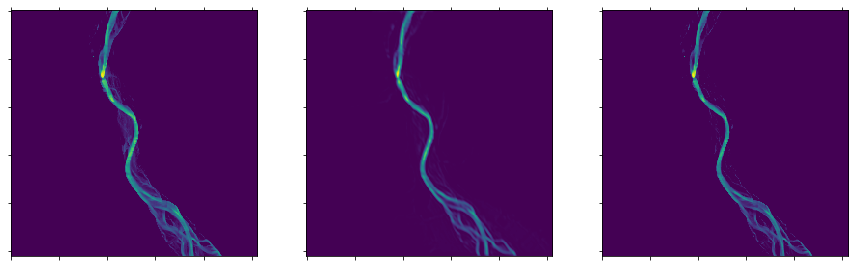

epoch 170 -- avg loss: 13017.081546164902
[!] Comparison matrices printed


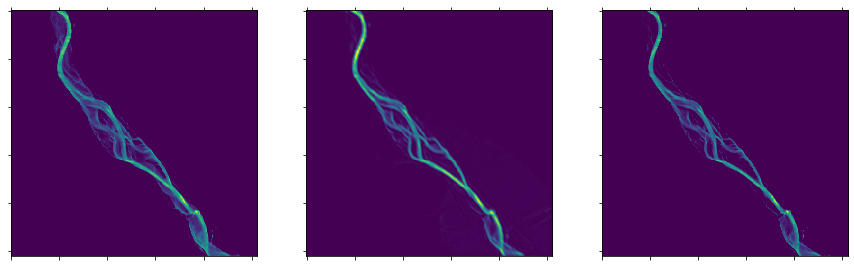

epoch 171 -- avg loss: 12979.444036584577
[!] Comparison matrices printed


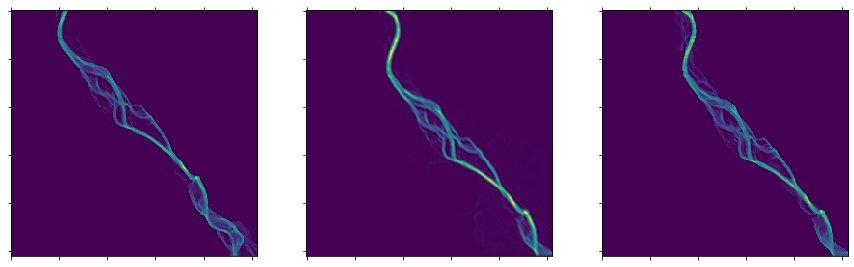

epoch 172 -- avg loss: 12942.185719733105
[!] Comparison matrices printed


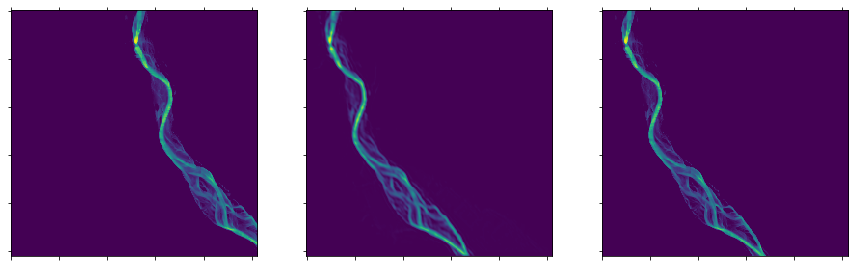

epoch 173 -- avg loss: 12905.300588960557
[!] Comparison matrices printed


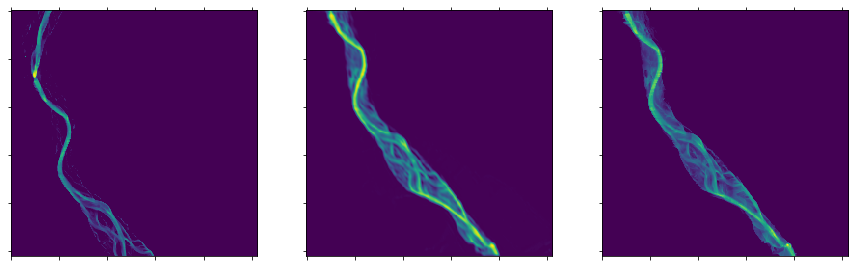

epoch 174 -- avg loss: 12868.78300849419
[!] Comparison matrices printed


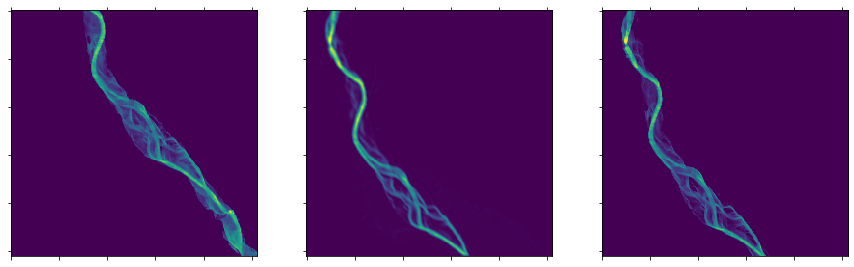

epoch 175 -- avg loss: 12832.627232055034
[!] Comparison matrices printed


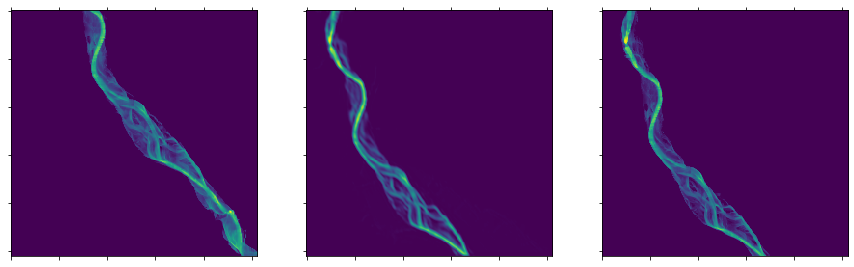

epoch 176 -- avg loss: 12796.827693114357
[!] Comparison matrices printed


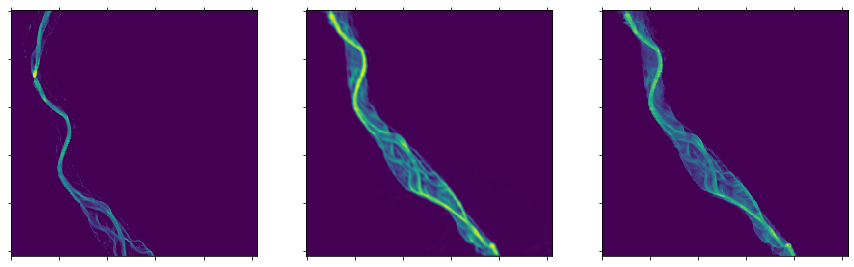

epoch 177 -- avg loss: 12761.378954722763
[!] Comparison matrices printed


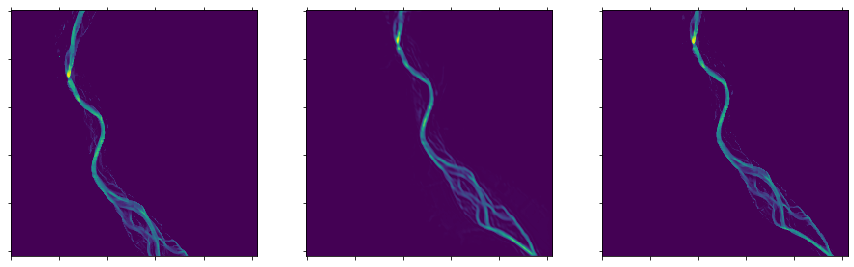

epoch 178 -- avg loss: 12726.275684517492
[!] Comparison matrices printed


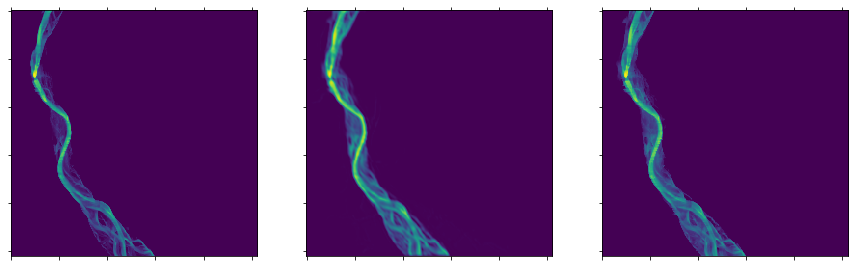

epoch 179 -- avg loss: 12691.512714409106
[!] Comparison matrices printed


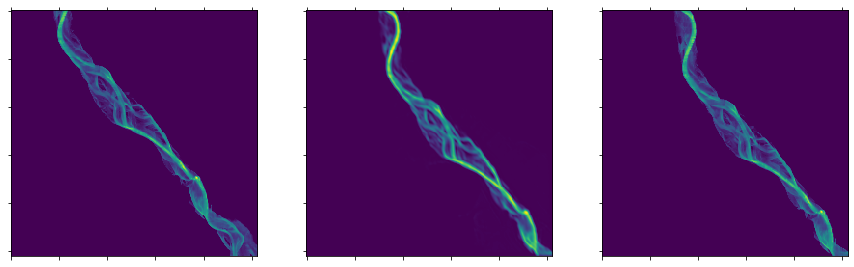

epoch 180 -- avg loss: 12657.08495785662
[!] Comparison matrices printed


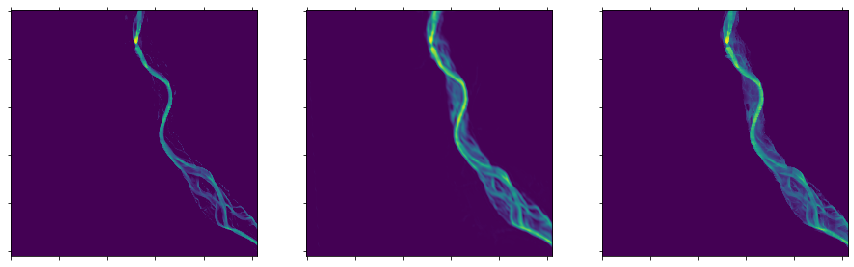

epoch 181 -- avg loss: 12622.987421590251
[!] Comparison matrices printed


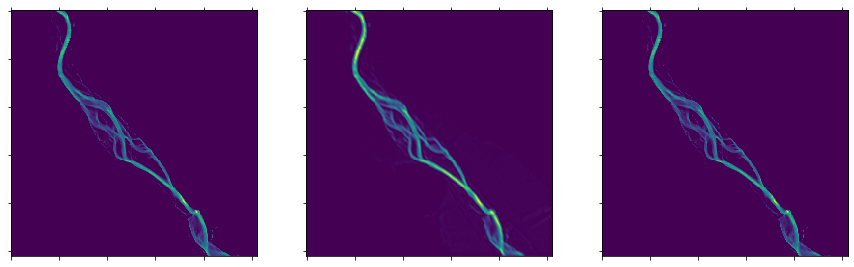

epoch 182 -- avg loss: 12589.215006010128
[!] Comparison matrices printed


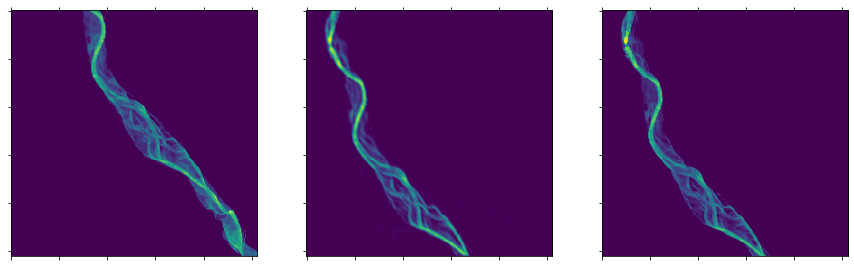

epoch 183 -- avg loss: 12555.762971282476
[!] Comparison matrices printed


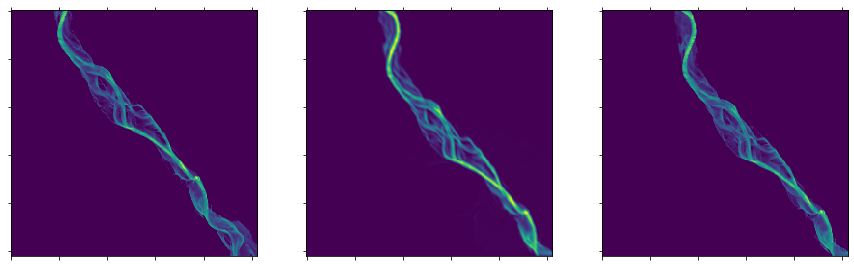

epoch 184 -- avg loss: 12522.626674327803
[!] Comparison matrices printed


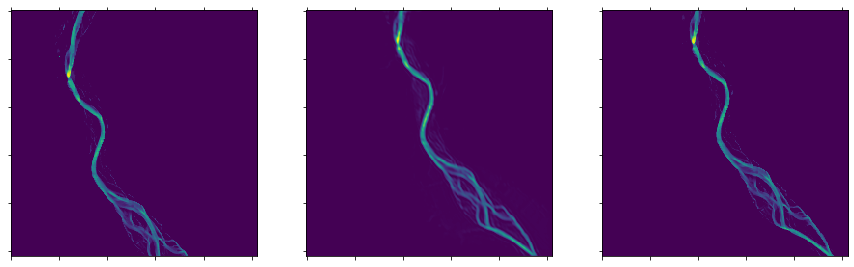

epoch 185 -- avg loss: 12489.801374001005
[!] Comparison matrices printed


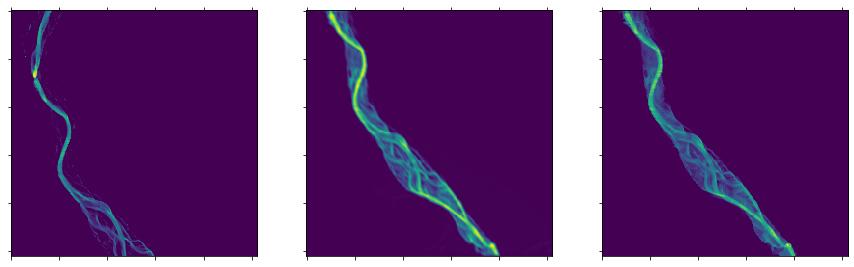

epoch 186 -- avg loss: 12457.282530684928
[!] Comparison matrices printed


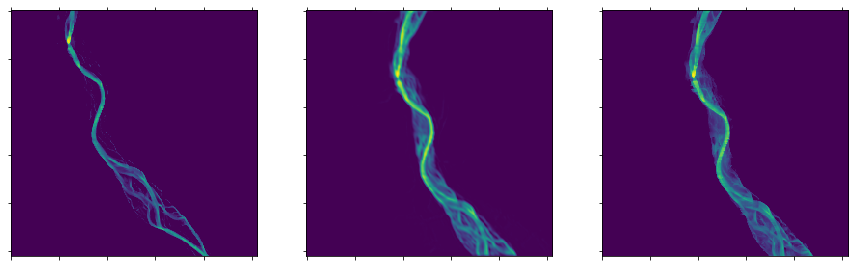

epoch 187 -- avg loss: 12425.065763196815
[!] Comparison matrices printed


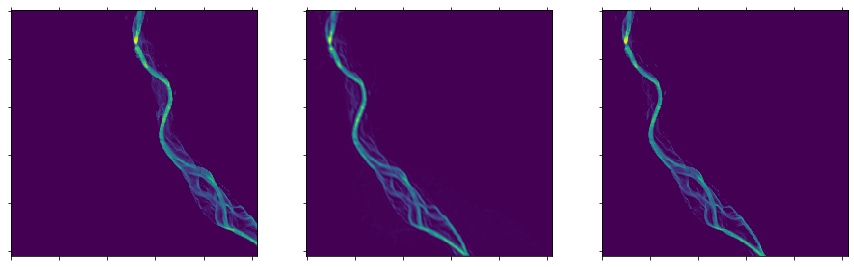

epoch 188 -- avg loss: 12393.14670294486
[!] Comparison matrices printed


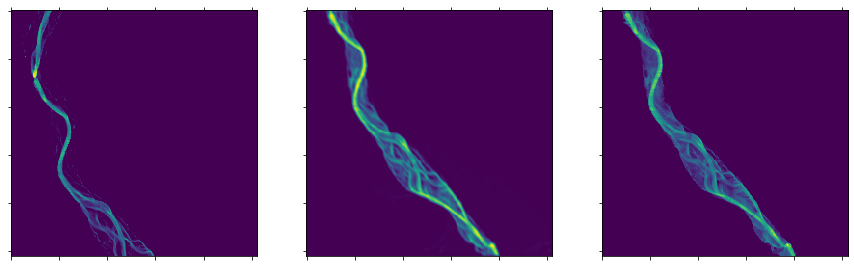

epoch 189 -- avg loss: 12361.521073512027
[!] Comparison matrices printed


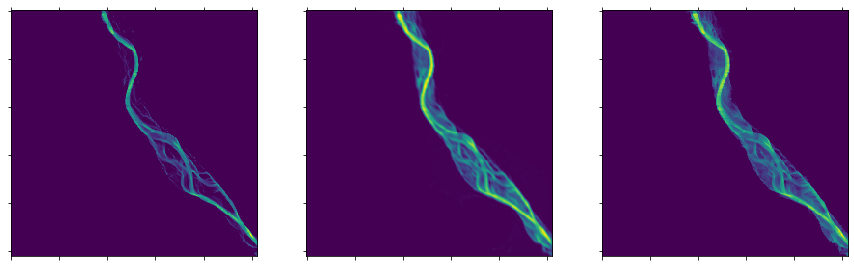

epoch 190 -- avg loss: 12330.18458005895
[!] Comparison matrices printed


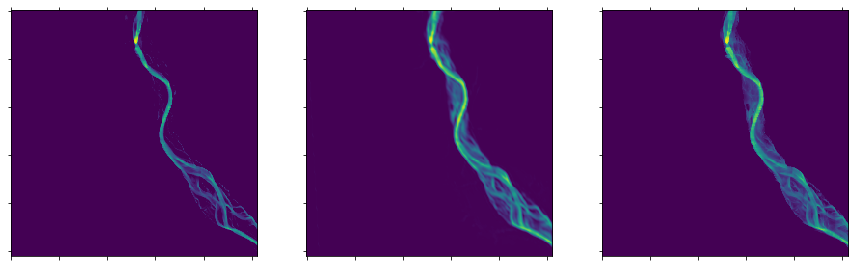

epoch 191 -- avg loss: 12299.133129755655
[!] Comparison matrices printed


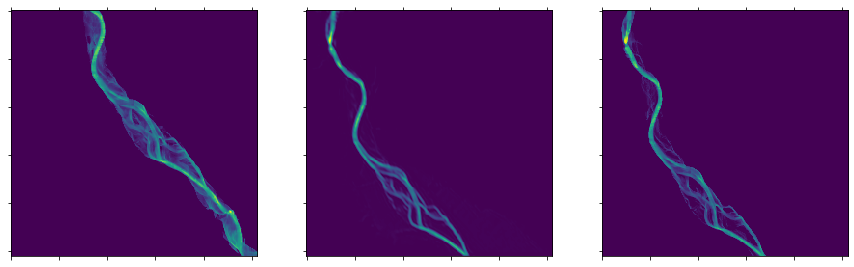

epoch 192 -- avg loss: 12268.362630907905
[!] Comparison matrices printed


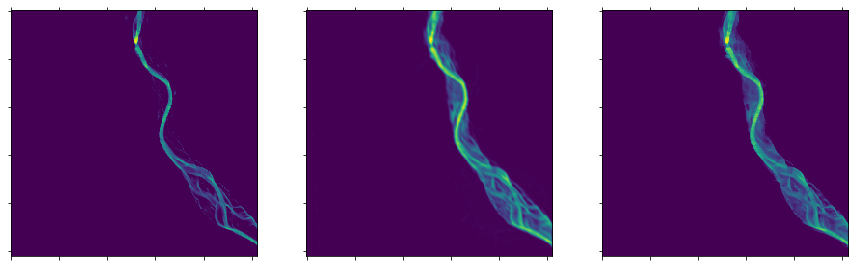

epoch 193 -- avg loss: 12237.869162047367
[!] Comparison matrices printed


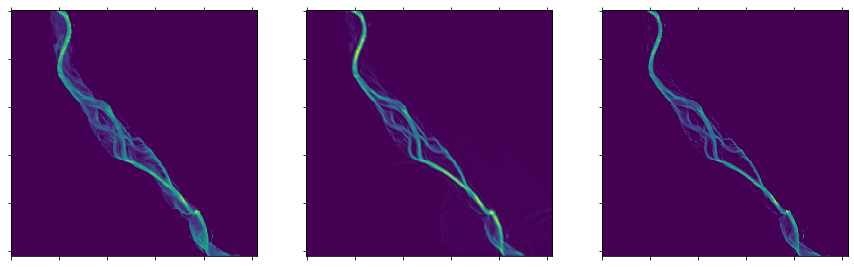

epoch 194 -- avg loss: 12207.64878349393
[!] Comparison matrices printed


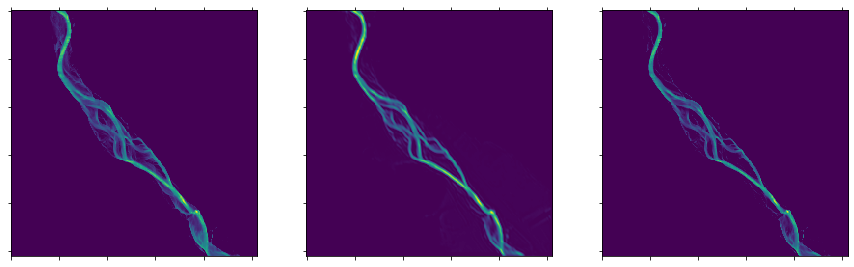

epoch 195 -- avg loss: 12177.697631623616
[!] Comparison matrices printed


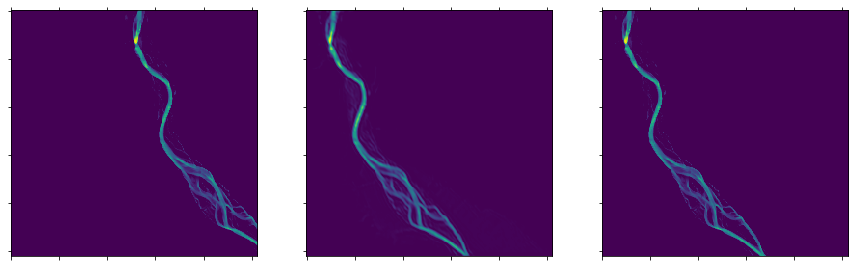

epoch 196 -- avg loss: 12148.011988211625
[!] Comparison matrices printed


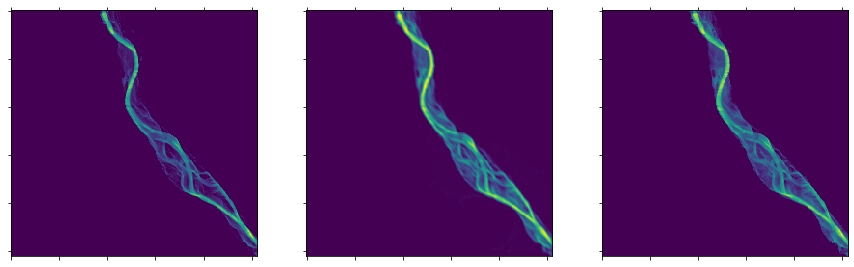

epoch 197 -- avg loss: 12118.588199009471
[!] Comparison matrices printed


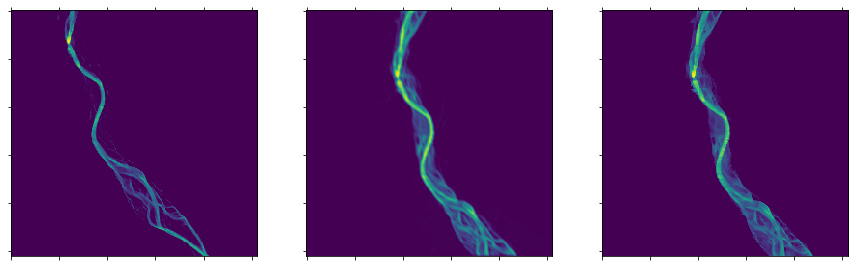

epoch 198 -- avg loss: 12089.422631150024
[!] Comparison matrices printed


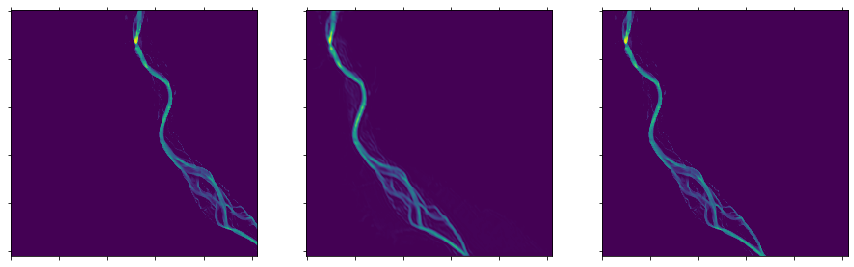

epoch 199 -- avg loss: 12060.511768105247
[!] Comparison matrices printed


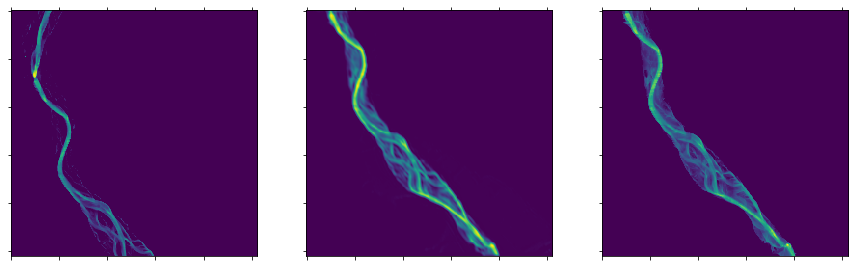

Finished Training


In [52]:
epochs = 200

for epoch in range(epochs):  # loop over the dataset multiple times

    for i, batch in enumerate(X_train):

        optimizer.zero_grad()

        # ---- Predicting
        #print(X_train.shape)
        #print(batch.shape)
        outputs = net(batch,1) # 0 for layer index, 0 for h index

        # ---- Batch Loss

        loss = criterion(outputs[:,0,:,:], y_train[i,:,0,0,:,:])
        #loss += mass_conservation_loss(outputs[:,0,:,:], y_train[i,:,0,0,:,:])
        '''
        ssim_loss = None
        for x in range(outputs.shape[1]):
            img1 = Variable( outputs[x,0,:,:].unsqueeze(0),  requires_grad=False)
            img2 = Variable( y_train[i,x,0,0,:,:].unsqueeze(0).unsqueeze(0), requires_grad = True)

            if ssim_loss is None: ssim_loss = 1/ssim(img1, img2)
            else: ssim_loss += 1/ssim(img1, img2)

            #loss += mass_conservation_loss(img1, img2)

            #print("ssim loss: \t{}".format(-criterion(img1, img2)))
            #print("mass conservation loss:\t{}".format(mass_conservation_loss(img1, img2)))

        loss = criterion(outputs[:,0,:,:], y_train[i,:,0,0,:,:]) + ssim_loss
        '''

        loss.backward()
        optimizer.step()

        # print statistics
        losses.append(loss.item())

        #print("batch {} - loss {}".format(i, loss.item()))

    if epoch % 1 == 0:

        print("epoch {} -- avg loss: {}".format(epoch, np.mean(losses)))

        k = np.random.randint(len(X_test))

        outputs = net(X_test[k],1) # 0 for layer index, 0 for h index

        #np.savetxt('output.txt',outputs[0,0,:,:].cpu().detach().numpy(),fmt='%.2f')
        #np.savetxt('real.txt',y_train[k,0,0,0].cpu().detach().numpy(),fmt='%.2f')

        print("[!] Comparison matrices printed")

        #------------------------------
        fig, axs = plt.subplots(1, 3, figsize=(plotsize,plotsize))

        for ax in axs:
            ax.set_yticklabels([])
            ax.set_xticklabels([])

        # pick random datapoint from batch
        x = np.random.randint(X_test[k].shape[0])

        for i,frame in enumerate(X_train[k,x,-1:]):
            axs[i].matshow(frame[0].cpu().detach().numpy())

        #predicted = th.mm(outputs[x][0], X_train[k,x,-1,1])
        axs[i+1].matshow(outputs[x][0][0].cpu().detach().numpy())
        axs[i+2].matshow(y_test[k,x][0][0].cpu().detach().numpy())
        #axs[i+2].matshow(outputs[x][1].cpu().detach().numpy())
        #axs[i+3].matshow(outputs[x][2].cpu().detach().numpy())

        plt.show()
        #------------------------------

        #if epoch % 10 == 0:
        #    print('[%d, %5d] loss: %.3f' %
        #          (epoch + 1, i + 1, running_loss / 2000))
        #    running_loss = 0.0

print('Finished Training')

In [53]:
th.save(net.state_dict(), "3_8_21.weights")
'''
num_run = len(os.listdir("runs/")) + 1
now = datetime.now()
foldername = "train_{}_{}".format(num_run, now.strftime("%d_%m_%Y_%H_%M_%S"))
os.mkdir("runs/" + foldername)

weights_path = "runs/" + foldername + "/model.weights"
th.save(net.state_dict(), weights_path)
'''

'\nnum_run = len(os.listdir("runs/")) + 1\nnow = datetime.now()\nfoldername = "train_{}_{}".format(num_run, now.strftime("%d_%m_%Y_%H_%M_%S"))\nos.mkdir("runs/" + foldername)\n\nweights_path = "runs/" + foldername + "/model.weights"\nth.save(net.state_dict(), weights_path)\n'

In [ ]:
mpl.rcParams['text.color'] = 'k'

plt.title("loss")
plt.plot(range(len(losses)), losses)
pass

In [ ]:
'''
plt.title("relative error")
plt.plot(range(len(errors)), errors, label="train")
plt.plot(range(len(test_errors)), test_errors, label="test")
plt.legend()
pass


In [ ]:
mpl.rcParams['text.color'] = 'w'
prep = Preprocessing()

In [ ]:
j = np.random.randint(len(y_test))
j = 3
m = 2
k = 4

print("k = {}".format(k))

#k = 5
input = th.unsqueeze(X_test[j, m], 0)
outputs = net(input)

#------------------------------
num_predicted_frames = outputs[0, 0].shape[0] # per allineare frames passati e futuri
fig, axs = plt.subplots(1, num_predicted_frames, figsize=(plotsize,plotsize))

for ax in axs:
    ax.set_yticklabels([])
    ax.set_xticklabels([])

for i,frame in enumerate(input[0,0,-num_predicted_frames:]):
    frame = frame.cpu().detach().numpy()
    axs[i].matshow(frame)
    axs[i].set_title('t = {}'.format(i))

print("======== Past frames ========")
plt.show()

print("======== True Future vs Predicted frames ========")

#------------------------------
fig, axs = plt.subplots(1, num_predicted_frames, figsize=(plotsize,plotsize))

for ax in axs:
    ax.set_yticklabels([])
    ax.set_xticklabels([])

for i,frame in enumerate(y_test[j,m,0]):
    axs[i].matshow(frame.cpu().detach().numpy())
    axs[i].set_title('t = {}'.format(i+num_predicted_frames))

plt.show()
#------------------------------
fig, axs = plt.subplots(1, outputs[0,0].shape[0], figsize=(plotsize,plotsize))

for ax in axs:
    ax.set_yticklabels([])
    ax.set_xticklabels([])

for i,frame in enumerate(outputs[0,0]):
    attention_mask = outputs[0,1,i].cpu().detach().numpy()
    y_frame = frame.cpu().detach().numpy()
    y_true = y_test[j,m,0,i].cpu().detach().numpy()

    y_frame = np.dot(y_frame, attention_mask)
    y_true = np.dot(y_true, attention_mask)

    print(y_frame[:5,:5])
    print("#-------------")
    print(y_true[:5,:5])
    print("\n\n")

    ssim = prep.pytorch_ssim(y_true, y_frame).item()
    axs[i].matshow(y_frame)
    axs[i].set_title('ssim = {}'.format(ssim))

plt.show()
#------------------------------

In [ ]:
print("k = {}".format(k))
iterations = 4
#k = 5

input = th.unsqueeze(X_train[k,0], 0)
outputs = net(input)

#------------------------------
print("======== Past frames ========")
num_predicted_frames = outputs[0,0].shape[0] # per allineare frames passati e futuri
fig, axs = plt.subplots(1, num_predicted_frames, figsize=(plotsize,plotsize))

for ax in axs:
    ax.set_yticklabels([])
    ax.set_xticklabels([])

for i,frame in enumerate(input[0,0,-num_predicted_frames:]):
    axs[i].matshow(frame.cpu().detach().numpy())
    axs[i].set_title('t = {}'.format(i))

plt.show()
#------------------------------
print("======== True vs Autoregressive Pred Frames  ========")
fig, axs = plt.subplots(1, num_predicted_frames, figsize=(plotsize,plotsize))

true_means = []

for ax in axs:
    ax.set_yticklabels([])
    ax.set_xticklabels([])

for i,frame in enumerate(y_train[k,0,0]):
    axs[i].matshow(frame.cpu().detach().numpy())
    axs[i].set_title('t = {}'.format(i+num_predicted_frames))
    true_means.append(frame.cpu().detach().numpy().mean())

plt.show()
#------------------------------

#i = np.random.randint(len(X_test))
input = th.unsqueeze(X_train[k][0], 0)

fig, axs = plt.subplots(1, iterations, figsize=(plotsize,plotsize))

for ax in axs:
    ax.set_yticklabels([])
    ax.set_xticklabels([])

predicted_means = []
for x in range(iterations):
    # first predicted frame only
    output = th.unsqueeze(net(input)[:,:,0,:,:],2)
    # next frame = first predicted from output + btm map
    next_frame = output.detach()
    next_frame = th.cat((next_frame, th.unsqueeze(input[:,2:,0,:,:],2)), axis=1)
    # added on top of (input sequence - first frame)
    input = th.cat((next_frame, input[:,:,1:,:]), axis=2)

    axs[x].matshow(output[0,0,0].cpu().detach().numpy())
    axs[x].set_title('t = {}'.format(x+num_predicted_frames))
    predicted_means.append(output[0,0,0].cpu().detach().numpy().mean())
    #print(np.mean(output[0,0,0].cpu().detach().numpy()))

plt.show()

In [ ]:
mpl.rcParams['text.color'] = 'b'

plt.clf()
plt.plot(range(len(true_means)), true_means,  "-b", label="True frames mean")
plt.plot(range(len(true_means)), true_means,  "*")

plt.plot(range(len(predicted_means)), predicted_means,  "-g", label="Predicted frames mean")
plt.plot(range(len(predicted_means)), predicted_means,  "*")
plt.grid()
plt.legend()
pass

In [ ]:
print("{:<20s}{:<20s}{:<20s}{:<20s}{:<20s}".format("", "min", "max", "mean", "std"))
print("{:<20s}{:<20f}{:<20f}{:<20f}{:<20f}".format("prediction", th.min(outputs), th.max(outputs), th.mean(outputs), th.std(outputs)))
print("{:<20s}{:<20f}{:<20f}{:<20f}{:<20f}".format("true", th.min(y_test[0]), th.max(y_test[0]), th.mean(y_test[0]), th.std(y_test[0])))
'''